In [1]:
import glob
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import time
import os

import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

In [2]:
physical_devices = tf.config.list_physical_devices('GPU')
print(physical_devices)
for gpu in physical_devices:
    tf.config.experimental.set_memory_growth(gpu, enable=True)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2023-01-08 09:06:13.866874: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-08 09:06:13.964136: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-08 09:06:13.965105: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [3]:
file_names = []
folders = ['train', 'val', 'test']
for folder in folders:
  file_names += glob.glob(f'/kaggle/input/chest-xray-pneumonia/chest_xray/{folder}/NORMAL/*')
file_names = np.array(file_names)
np.random.shuffle(file_names)

In [4]:
data = []
for sample in file_names[:300]:
  img = Image.open(sample)
  img = img.resize((800, 800))
  data.append(np.array(img))

In [5]:
data = np.array(data).reshape(-1, 800, 800, 1).astype('float32')
data = (data - 127.5) / 127.5

In [6]:
BUFFER_SIZE = 100
BATCH_SIZE = 10
train_dataset = tf.data.Dataset.from_tensor_slices(data).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

2023-01-08 09:06:28.408338: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-08 09:06:28.408817: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-08 09:06:28.409744: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-08 09:06:28.410401: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA 

In [7]:
def make_generator_model():
    input_1 = Input(shape=(100, ), name = "Input_image")
    x = Dense(25*25*512, use_bias=False)(input_1)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Reshape((25, 25, 512))(x)

    x = Conv2DTranspose(512, (3, 3), strides=(1, 1), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(256, (3, 3), strides=(1, 1), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(32, (7, 7), strides=(2, 2), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(16, (9, 9), strides=(2, 2), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(1, (11, 11), strides=(2, 2), padding='same', use_bias=False, activation='tanh')(x)
    model = Model(inputs=input_1, outputs=x)
    
    return model

2023-01-08 09:06:34.126259: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


(1, 800, 800, 1)


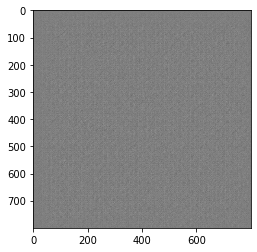

In [8]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
print(generated_image.shape)
plt.imshow(generated_image[0, :, :, 0], cmap='gray');

In [9]:
def make_discriminator_model():
    input_1 = Input(shape=(800, 800, 1), name = "Input_image")
    x = Conv2D(16, (11, 11), strides=(2, 2), padding='same')(input_1)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Conv2D(32, (9, 9), strides=(2, 2), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Conv2D(64, (7, 7), strides=(2, 2), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Conv2D(128, (5, 5), strides=(2, 2), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Conv2D(256, (3, 3), strides=(2, 2), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Conv2D(512, (1, 1), strides=(1, 1), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Flatten()(x)
    x = Dense(1)(x)
    model = Model(inputs=input_1, outputs=x)
    
    return model

In [10]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[-6.120804e-06]], shape=(1, 1), dtype=float32)


In [11]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [12]:
EPOCHS = 4000
noise_dim = 100
num_examples_to_generate = 1

seed = tf.random.normal([num_examples_to_generate, noise_dim])

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    if epoch % 100 == 0:
      generate_and_save_images(generator,
                              epoch + 1,
                              seed)
#       checkpoint.save(file_prefix = checkpoint_prefix)


    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))


In [13]:
def generate_and_save_images(model, epoch, test_input):
  predictions = model(test_input, training=False)
  fig = plt.figure(figsize=(12, 12))
  plt.imshow(predictions[0, :, :, 0] * 127.5 + 127.5, cmap='gray')
  plt.axis('off')
  plt.savefig('/kaggle/working/images/image_at_epoch_{:04d}.png'.format(epoch), bbox_inches='tight', pad_inches=0)
  plt.show()

In [14]:
!mkdir /kaggle/working/generator
!mkdir /kaggle/working/discriminator
!mkdir /kaggle/working/images

2023-01-08 09:06:45.409383: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


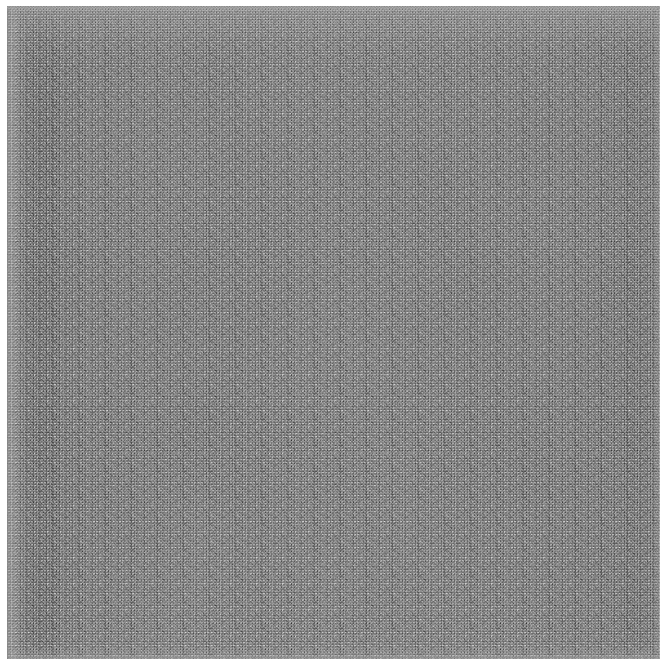

Time for epoch 1 is 13.242703914642334 sec
Time for epoch 2 is 9.24071192741394 sec
Time for epoch 3 is 9.408499479293823 sec
Time for epoch 4 is 9.222466468811035 sec
Time for epoch 5 is 9.264272212982178 sec
Time for epoch 6 is 9.20552110671997 sec
Time for epoch 7 is 9.205097913742065 sec
Time for epoch 8 is 9.231227397918701 sec
Time for epoch 9 is 9.349040031433105 sec
Time for epoch 10 is 9.20649266242981 sec
Time for epoch 11 is 9.210937261581421 sec
Time for epoch 12 is 9.24198603630066 sec
Time for epoch 13 is 9.218710899353027 sec
Time for epoch 14 is 9.216243982315063 sec
Time for epoch 15 is 9.449643611907959 sec
Time for epoch 16 is 9.218836307525635 sec
Time for epoch 17 is 9.211165428161621 sec
Time for epoch 18 is 9.234824895858765 sec
Time for epoch 19 is 9.196708917617798 sec
Time for epoch 20 is 9.210285663604736 sec
Time for epoch 21 is 9.214695692062378 sec
Time for epoch 22 is 9.356518983840942 sec
Time for epoch 23 is 9.20911955833435 sec
Time for epoch 24 is 9.2

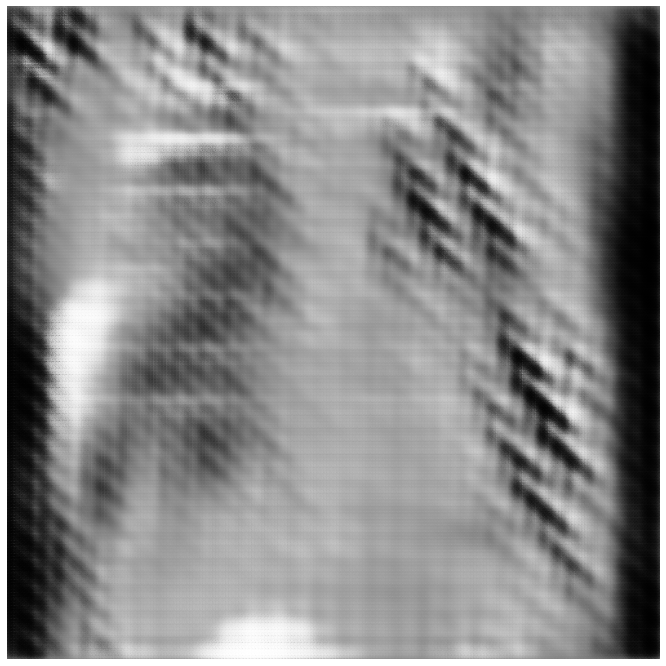

Time for epoch 101 is 9.908301830291748 sec
Time for epoch 102 is 9.200581312179565 sec
Time for epoch 103 is 9.209210634231567 sec
Time for epoch 104 is 9.461968421936035 sec
Time for epoch 105 is 9.19106650352478 sec
Time for epoch 106 is 9.196859121322632 sec
Time for epoch 107 is 9.212541341781616 sec
Time for epoch 108 is 9.219080448150635 sec
Time for epoch 109 is 9.223040580749512 sec
Time for epoch 110 is 9.561834573745728 sec
Time for epoch 111 is 9.210297346115112 sec
Time for epoch 112 is 9.23806357383728 sec
Time for epoch 113 is 9.19340205192566 sec
Time for epoch 114 is 9.203642129898071 sec
Time for epoch 115 is 9.299447774887085 sec
Time for epoch 116 is 11.114951133728027 sec
Time for epoch 117 is 9.193414688110352 sec
Time for epoch 118 is 9.466033458709717 sec
Time for epoch 119 is 9.261790990829468 sec
Time for epoch 120 is 9.380411863327026 sec
Time for epoch 121 is 9.203808307647705 sec
Time for epoch 122 is 9.209638357162476 sec
Time for epoch 123 is 9.2064602375

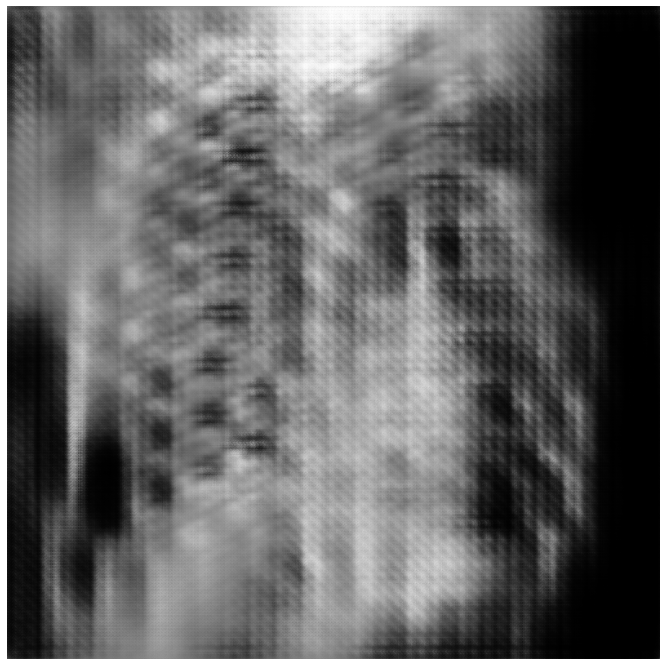

Time for epoch 201 is 9.940969228744507 sec
Time for epoch 202 is 9.25242829322815 sec
Time for epoch 203 is 9.237245082855225 sec
Time for epoch 204 is 9.237081289291382 sec
Time for epoch 205 is 9.498258590698242 sec
Time for epoch 206 is 9.426421642303467 sec
Time for epoch 207 is 9.231618404388428 sec
Time for epoch 208 is 9.261203289031982 sec
Time for epoch 209 is 9.214565992355347 sec
Time for epoch 210 is 9.203945875167847 sec
Time for epoch 211 is 9.207410335540771 sec
Time for epoch 212 is 9.338726997375488 sec
Time for epoch 213 is 9.226440668106079 sec
Time for epoch 214 is 9.211503505706787 sec
Time for epoch 215 is 9.228062391281128 sec
Time for epoch 216 is 9.260484457015991 sec
Time for epoch 217 is 9.238769054412842 sec
Time for epoch 218 is 9.228637933731079 sec
Time for epoch 219 is 9.225103855133057 sec
Time for epoch 220 is 9.271348237991333 sec
Time for epoch 221 is 11.017619609832764 sec
Time for epoch 222 is 9.232638359069824 sec
Time for epoch 223 is 9.20251607

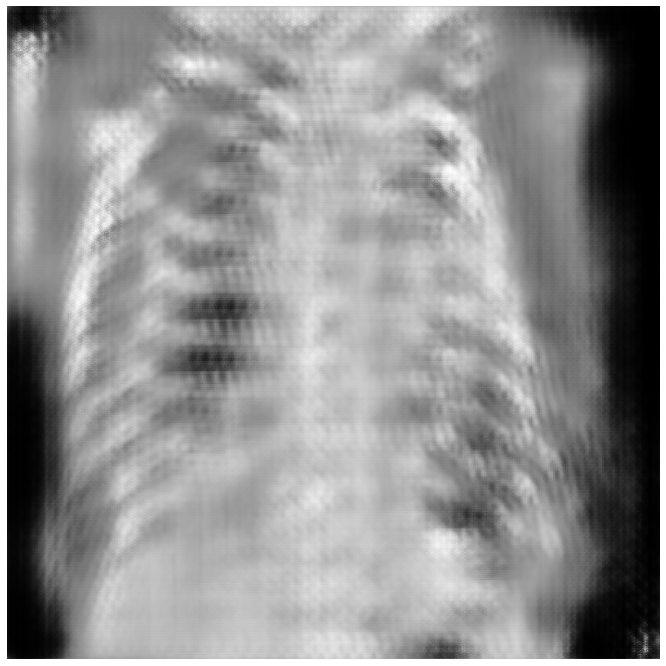

Time for epoch 301 is 9.995349645614624 sec
Time for epoch 302 is 9.335677862167358 sec
Time for epoch 303 is 9.534440994262695 sec
Time for epoch 304 is 9.233232975006104 sec
Time for epoch 305 is 9.205140829086304 sec
Time for epoch 306 is 9.214032649993896 sec
Time for epoch 307 is 9.208373069763184 sec
Time for epoch 308 is 9.243403673171997 sec
Time for epoch 309 is 9.232265710830688 sec
Time for epoch 310 is 9.211803674697876 sec
Time for epoch 311 is 9.19749665260315 sec
Time for epoch 312 is 9.235712051391602 sec
Time for epoch 313 is 9.216721773147583 sec
Time for epoch 314 is 9.202244520187378 sec
Time for epoch 315 is 9.405783653259277 sec
Time for epoch 316 is 9.231252908706665 sec
Time for epoch 317 is 9.219515800476074 sec
Time for epoch 318 is 9.210978984832764 sec
Time for epoch 319 is 9.20594072341919 sec
Time for epoch 320 is 9.501559257507324 sec
Time for epoch 321 is 9.312921047210693 sec
Time for epoch 322 is 9.196548223495483 sec
Time for epoch 323 is 9.2302665710

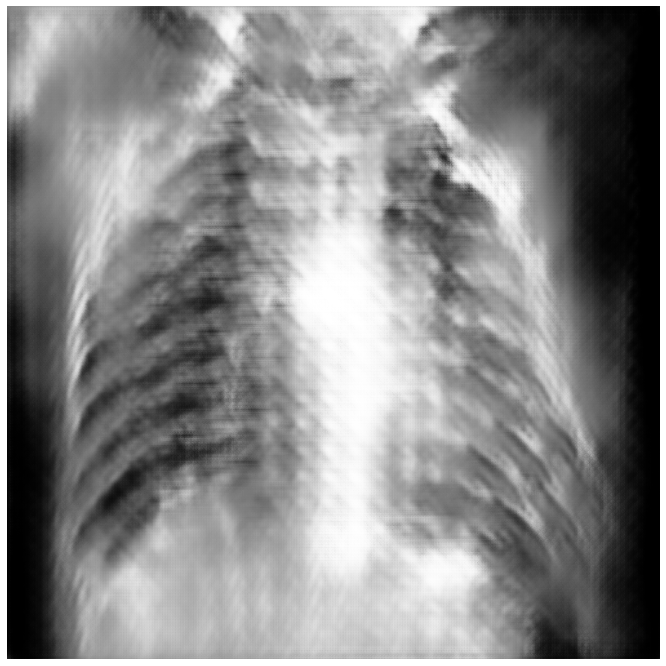

Time for epoch 401 is 9.921454191207886 sec
Time for epoch 402 is 9.22141408920288 sec
Time for epoch 403 is 9.238027811050415 sec
Time for epoch 404 is 9.45498538017273 sec
Time for epoch 405 is 9.223368406295776 sec
Time for epoch 406 is 9.209999322891235 sec
Time for epoch 407 is 11.0355966091156 sec
Time for epoch 408 is 9.253001689910889 sec
Time for epoch 409 is 9.206322431564331 sec
Time for epoch 410 is 9.219751119613647 sec
Time for epoch 411 is 9.208909511566162 sec
Time for epoch 412 is 9.248353719711304 sec
Time for epoch 413 is 9.224977254867554 sec
Time for epoch 414 is 9.253162384033203 sec
Time for epoch 415 is 9.279622316360474 sec
Time for epoch 416 is 9.254780530929565 sec
Time for epoch 417 is 9.222322702407837 sec
Time for epoch 418 is 9.514449119567871 sec
Time for epoch 419 is 9.224162817001343 sec
Time for epoch 420 is 9.238075256347656 sec
Time for epoch 421 is 9.214747667312622 sec
Time for epoch 422 is 9.234736204147339 sec
Time for epoch 423 is 9.22663211822

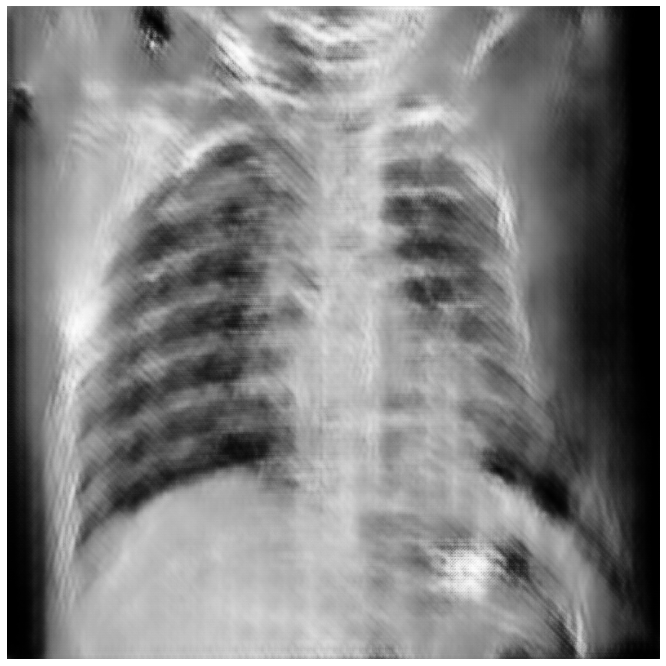

Time for epoch 501 is 9.910065650939941 sec
Time for epoch 502 is 9.241883039474487 sec
Time for epoch 503 is 9.214186191558838 sec
Time for epoch 504 is 9.249768018722534 sec
Time for epoch 505 is 9.214104413986206 sec
Time for epoch 506 is 9.582231283187866 sec
Time for epoch 507 is 9.212104320526123 sec
Time for epoch 508 is 9.24364948272705 sec
Time for epoch 509 is 9.239861249923706 sec
Time for epoch 510 is 9.213637113571167 sec
Time for epoch 511 is 9.238335371017456 sec
Time for epoch 512 is 9.254916667938232 sec
Time for epoch 513 is 9.358093738555908 sec
Time for epoch 514 is 9.22909951210022 sec
Time for epoch 515 is 9.21144437789917 sec
Time for epoch 516 is 9.281722068786621 sec
Time for epoch 517 is 9.220674276351929 sec
Time for epoch 518 is 9.225815773010254 sec
Time for epoch 519 is 9.211786270141602 sec
Time for epoch 520 is 9.286905527114868 sec
Time for epoch 521 is 9.21973967552185 sec
Time for epoch 522 is 9.241614580154419 sec
Time for epoch 523 is 9.512359380722

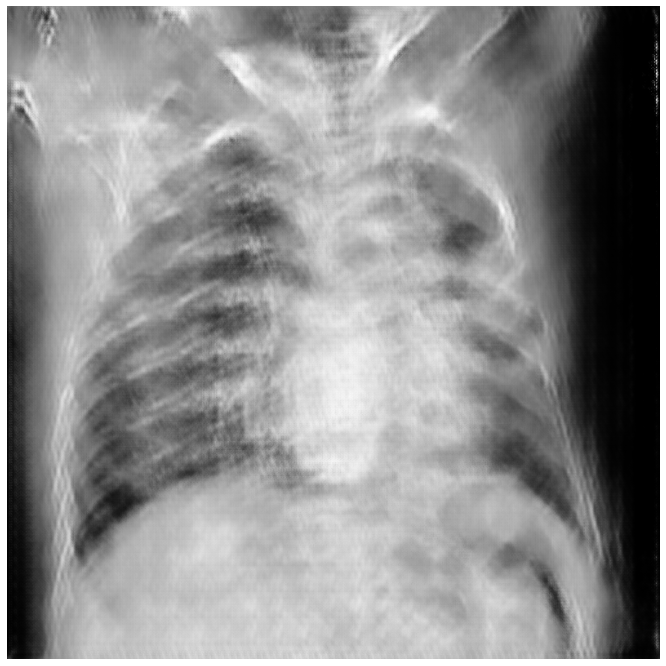

Time for epoch 601 is 10.227574586868286 sec
Time for epoch 602 is 9.23872184753418 sec
Time for epoch 603 is 9.241594791412354 sec
Time for epoch 604 is 9.266419887542725 sec
Time for epoch 605 is 9.212997436523438 sec
Time for epoch 606 is 9.210699796676636 sec
Time for epoch 607 is 9.219508647918701 sec
Time for epoch 608 is 9.246328830718994 sec
Time for epoch 609 is 9.29782772064209 sec
Time for epoch 610 is 9.203111171722412 sec
Time for epoch 611 is 9.647180080413818 sec
Time for epoch 612 is 9.286084175109863 sec
Time for epoch 613 is 9.20934534072876 sec
Time for epoch 614 is 9.22985577583313 sec
Time for epoch 615 is 9.32958459854126 sec
Time for epoch 616 is 9.259187459945679 sec
Time for epoch 617 is 9.215797424316406 sec
Time for epoch 618 is 9.21080756187439 sec
Time for epoch 619 is 9.212851762771606 sec
Time for epoch 620 is 9.241171836853027 sec
Time for epoch 621 is 9.196047306060791 sec
Time for epoch 622 is 9.216106653213501 sec
Time for epoch 623 is 9.2338454723358

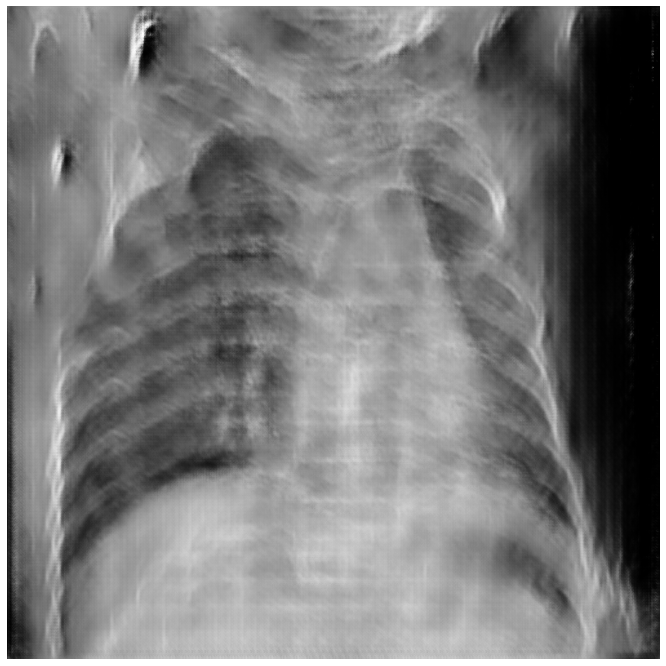

Time for epoch 701 is 9.895742416381836 sec
Time for epoch 702 is 9.22069787979126 sec
Time for epoch 703 is 9.22352147102356 sec
Time for epoch 704 is 9.396511316299438 sec
Time for epoch 705 is 9.24535346031189 sec
Time for epoch 706 is 9.264633178710938 sec
Time for epoch 707 is 9.205309629440308 sec
Time for epoch 708 is 9.279271602630615 sec
Time for epoch 709 is 9.236597537994385 sec
Time for epoch 710 is 9.253203868865967 sec
Time for epoch 711 is 9.289346933364868 sec
Time for epoch 712 is 9.280680894851685 sec
Time for epoch 713 is 9.220523118972778 sec
Time for epoch 714 is 9.235323905944824 sec
Time for epoch 715 is 9.22332763671875 sec
Time for epoch 716 is 9.768323421478271 sec
Time for epoch 717 is 9.390979528427124 sec
Time for epoch 718 is 9.213197469711304 sec
Time for epoch 719 is 9.209855079650879 sec
Time for epoch 720 is 9.25528597831726 sec
Time for epoch 721 is 9.238402605056763 sec
Time for epoch 722 is 9.247139692306519 sec
Time for epoch 723 is 9.2169153690338

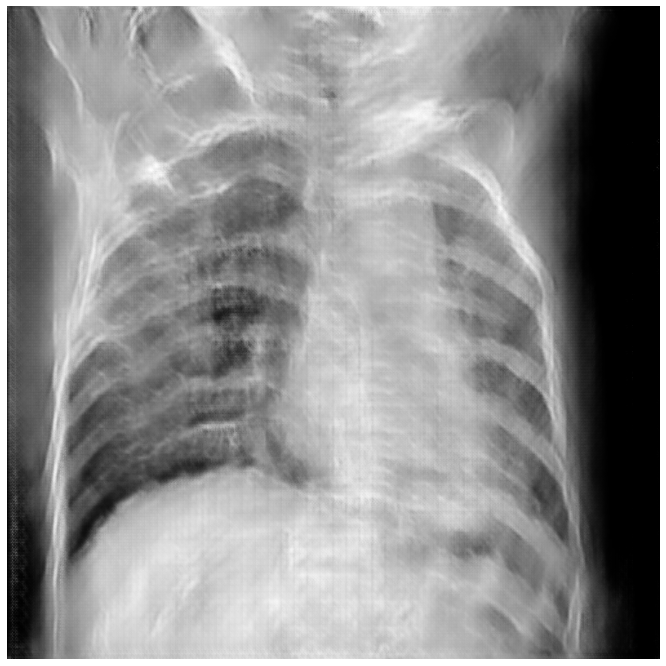

Time for epoch 801 is 9.897068977355957 sec
Time for epoch 802 is 9.205193281173706 sec
Time for epoch 803 is 9.192810297012329 sec
Time for epoch 804 is 9.245623588562012 sec
Time for epoch 805 is 9.197865009307861 sec
Time for epoch 806 is 9.213536024093628 sec
Time for epoch 807 is 9.40687084197998 sec
Time for epoch 808 is 9.264333009719849 sec
Time for epoch 809 is 9.21250319480896 sec
Time for epoch 810 is 9.207164287567139 sec
Time for epoch 811 is 9.200865745544434 sec
Time for epoch 812 is 9.260388374328613 sec
Time for epoch 813 is 9.349518775939941 sec
Time for epoch 814 is 9.55644702911377 sec
Time for epoch 815 is 9.253695487976074 sec
Time for epoch 816 is 9.244874000549316 sec
Time for epoch 817 is 9.217918634414673 sec
Time for epoch 818 is 9.208044528961182 sec
Time for epoch 819 is 9.235322713851929 sec
Time for epoch 820 is 9.33043360710144 sec
Time for epoch 821 is 9.206963777542114 sec
Time for epoch 822 is 9.22521686553955 sec
Time for epoch 823 is 9.2015075683593

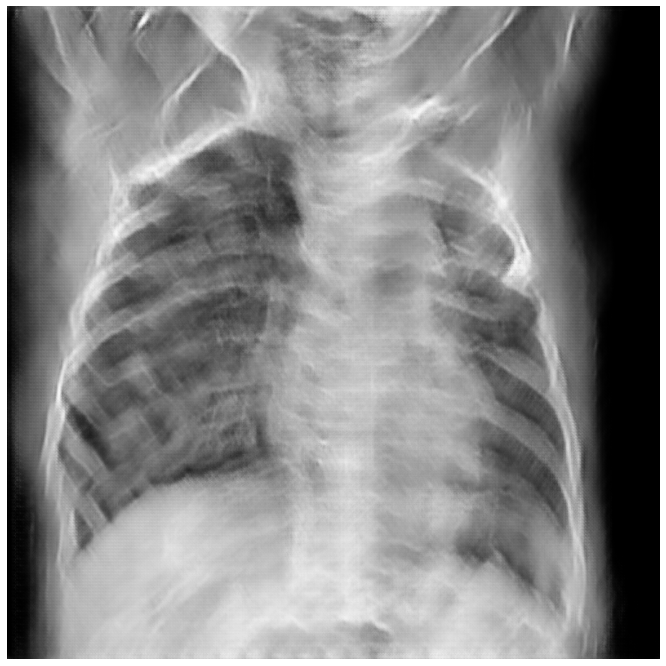

Time for epoch 901 is 9.90119981765747 sec
Time for epoch 902 is 9.219576358795166 sec
Time for epoch 903 is 9.229980707168579 sec
Time for epoch 904 is 9.422327280044556 sec
Time for epoch 905 is 9.240259408950806 sec
Time for epoch 906 is 11.017796993255615 sec
Time for epoch 907 is 9.204344749450684 sec
Time for epoch 908 is 9.269704818725586 sec
Time for epoch 909 is 9.218878984451294 sec
Time for epoch 910 is 9.232624053955078 sec
Time for epoch 911 is 9.334792375564575 sec
Time for epoch 912 is 9.343585729598999 sec
Time for epoch 913 is 9.205588579177856 sec
Time for epoch 914 is 9.23172926902771 sec
Time for epoch 915 is 9.228416919708252 sec
Time for epoch 916 is 9.267137050628662 sec
Time for epoch 917 is 9.205810546875 sec
Time for epoch 918 is 9.197488069534302 sec
Time for epoch 919 is 9.298542499542236 sec
Time for epoch 920 is 9.224411964416504 sec
Time for epoch 921 is 9.202233791351318 sec
Time for epoch 922 is 9.163697719573975 sec
Time for epoch 923 is 9.172490596771

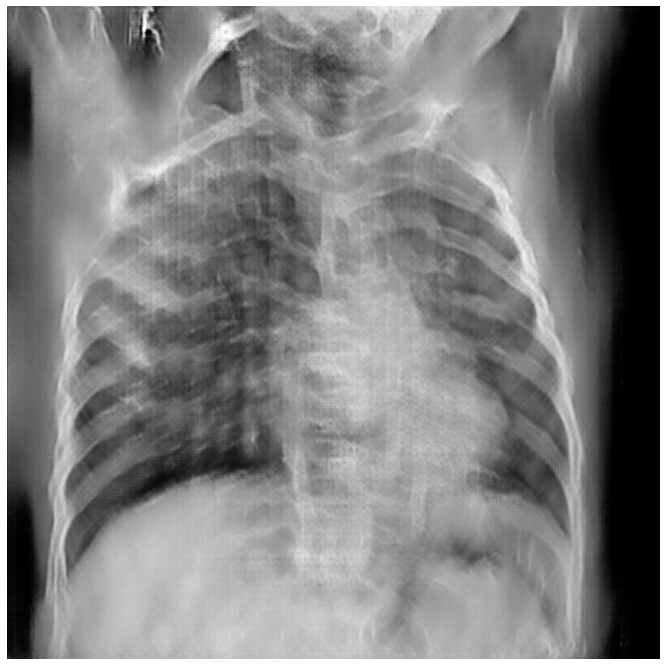

Time for epoch 1001 is 9.868344783782959 sec
Time for epoch 1002 is 9.185039281845093 sec
Time for epoch 1003 is 9.174212217330933 sec
Time for epoch 1004 is 9.21028447151184 sec
Time for epoch 1005 is 9.288567781448364 sec
Time for epoch 1006 is 9.173860549926758 sec
Time for epoch 1007 is 9.152112245559692 sec
Time for epoch 1008 is 9.213392734527588 sec
Time for epoch 1009 is 9.155075788497925 sec
Time for epoch 1010 is 9.156517744064331 sec
Time for epoch 1011 is 9.243887186050415 sec
Time for epoch 1012 is 9.244141101837158 sec
Time for epoch 1013 is 9.16125202178955 sec
Time for epoch 1014 is 9.510114669799805 sec
Time for epoch 1015 is 9.184092998504639 sec
Time for epoch 1016 is 9.25112271308899 sec
Time for epoch 1017 is 9.152249336242676 sec
Time for epoch 1018 is 9.174262523651123 sec
Time for epoch 1019 is 9.16321849822998 sec
Time for epoch 1020 is 9.219862222671509 sec
Time for epoch 1021 is 9.15341567993164 sec
Time for epoch 1022 is 9.166326761245728 sec
Time for epoch 

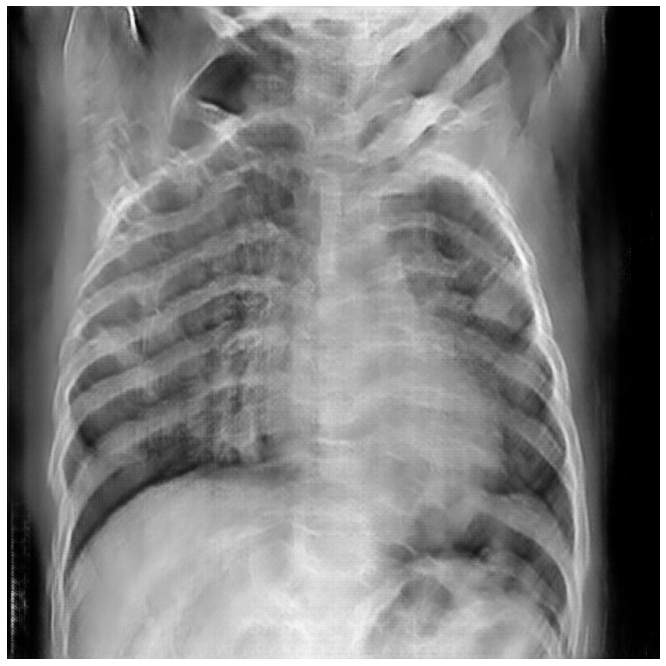

Time for epoch 1101 is 9.86585259437561 sec
Time for epoch 1102 is 9.19227933883667 sec
Time for epoch 1103 is 9.154282569885254 sec
Time for epoch 1104 is 9.222008466720581 sec
Time for epoch 1105 is 9.160456657409668 sec
Time for epoch 1106 is 9.338438272476196 sec
Time for epoch 1107 is 9.175628662109375 sec
Time for epoch 1108 is 9.23389983177185 sec
Time for epoch 1109 is 9.314630270004272 sec
Time for epoch 1110 is 9.163889408111572 sec
Time for epoch 1111 is 9.179652452468872 sec
Time for epoch 1112 is 9.413848638534546 sec
Time for epoch 1113 is 9.179000616073608 sec
Time for epoch 1114 is 9.160557508468628 sec
Time for epoch 1115 is 9.164883375167847 sec
Time for epoch 1116 is 9.233956098556519 sec
Time for epoch 1117 is 9.15512752532959 sec
Time for epoch 1118 is 9.188576698303223 sec
Time for epoch 1119 is 9.22171425819397 sec
Time for epoch 1120 is 9.234141111373901 sec
Time for epoch 1121 is 9.15676498413086 sec
Time for epoch 1122 is 9.208216428756714 sec
Time for epoch 1

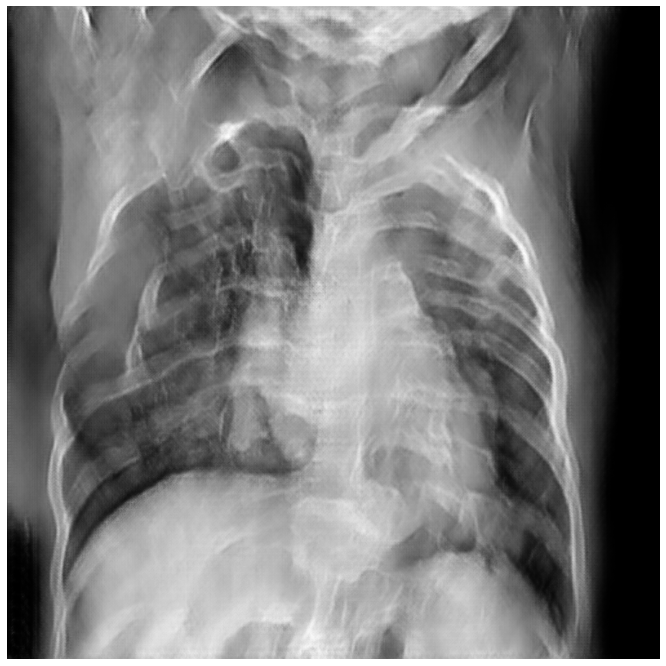

Time for epoch 1201 is 9.849034309387207 sec
Time for epoch 1202 is 9.164438486099243 sec
Time for epoch 1203 is 9.161183834075928 sec
Time for epoch 1204 is 9.28359341621399 sec
Time for epoch 1205 is 9.157302141189575 sec
Time for epoch 1206 is 9.197738885879517 sec
Time for epoch 1207 is 9.16642165184021 sec
Time for epoch 1208 is 9.232007265090942 sec
Time for epoch 1209 is 9.186409950256348 sec
Time for epoch 1210 is 9.178941011428833 sec
Time for epoch 1211 is 9.414577007293701 sec
Time for epoch 1212 is 9.276081085205078 sec
Time for epoch 1213 is 9.197265625 sec
Time for epoch 1214 is 9.159386157989502 sec
Time for epoch 1215 is 9.163246631622314 sec
Time for epoch 1216 is 9.230471849441528 sec
Time for epoch 1217 is 9.161352634429932 sec
Time for epoch 1218 is 9.241584300994873 sec
Time for epoch 1219 is 9.201553583145142 sec
Time for epoch 1220 is 9.239230632781982 sec
Time for epoch 1221 is 9.171774864196777 sec
Time for epoch 1222 is 9.15709114074707 sec
Time for epoch 1223

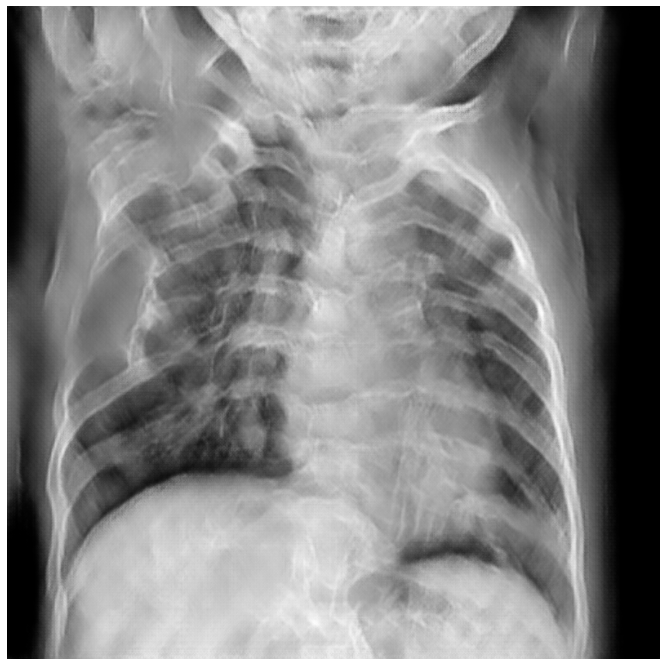

Time for epoch 1301 is 9.845693349838257 sec
Time for epoch 1302 is 9.171957731246948 sec
Time for epoch 1303 is 9.158673524856567 sec
Time for epoch 1304 is 9.274383068084717 sec
Time for epoch 1305 is 9.166751623153687 sec
Time for epoch 1306 is 9.501543283462524 sec
Time for epoch 1307 is 9.175128936767578 sec
Time for epoch 1308 is 9.252011060714722 sec
Time for epoch 1309 is 9.15907597541809 sec
Time for epoch 1310 is 9.15989899635315 sec
Time for epoch 1311 is 9.18341588973999 sec
Time for epoch 1312 is 9.43775749206543 sec
Time for epoch 1313 is 9.21111536026001 sec
Time for epoch 1314 is 9.169418573379517 sec
Time for epoch 1315 is 9.2092444896698 sec
Time for epoch 1316 is 9.406165361404419 sec
Time for epoch 1317 is 9.178746700286865 sec
Time for epoch 1318 is 9.308988809585571 sec
Time for epoch 1319 is 9.232707262039185 sec
Time for epoch 1320 is 9.32848596572876 sec
Time for epoch 1321 is 9.167152166366577 sec
Time for epoch 1322 is 9.192805528640747 sec
Time for epoch 132

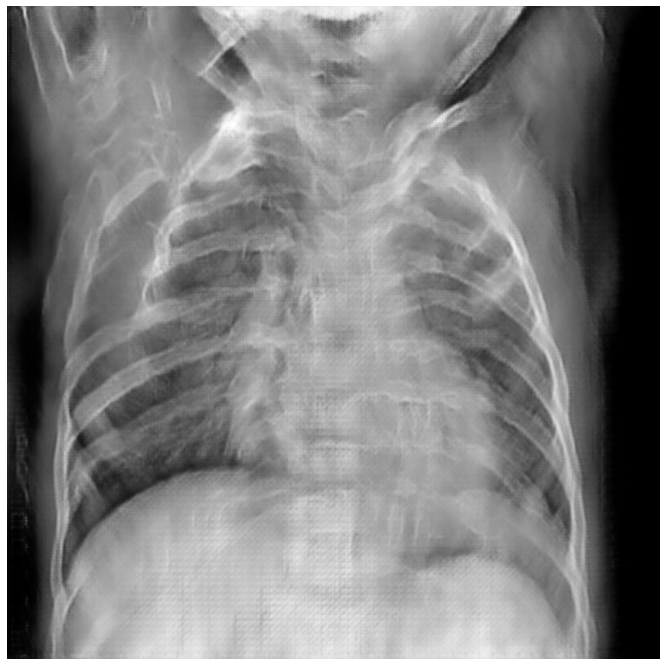

Time for epoch 1401 is 10.182018756866455 sec
Time for epoch 1402 is 9.1841299533844 sec
Time for epoch 1403 is 9.19707465171814 sec
Time for epoch 1404 is 9.275829315185547 sec
Time for epoch 1405 is 9.16878342628479 sec
Time for epoch 1406 is 9.17380142211914 sec
Time for epoch 1407 is 9.209236860275269 sec
Time for epoch 1408 is 9.287022352218628 sec
Time for epoch 1409 is 9.179318904876709 sec
Time for epoch 1410 is 9.179769515991211 sec
Time for epoch 1411 is 9.266982793807983 sec
Time for epoch 1412 is 9.259716033935547 sec
Time for epoch 1413 is 9.36603331565857 sec
Time for epoch 1414 is 9.174081802368164 sec
Time for epoch 1415 is 9.163957595825195 sec
Time for epoch 1416 is 9.286848068237305 sec
Time for epoch 1417 is 9.159203052520752 sec
Time for epoch 1418 is 9.209782361984253 sec
Time for epoch 1419 is 9.349492073059082 sec
Time for epoch 1420 is 9.294902086257935 sec
Time for epoch 1421 is 9.179561614990234 sec
Time for epoch 1422 is 9.16807222366333 sec
Time for epoch 1

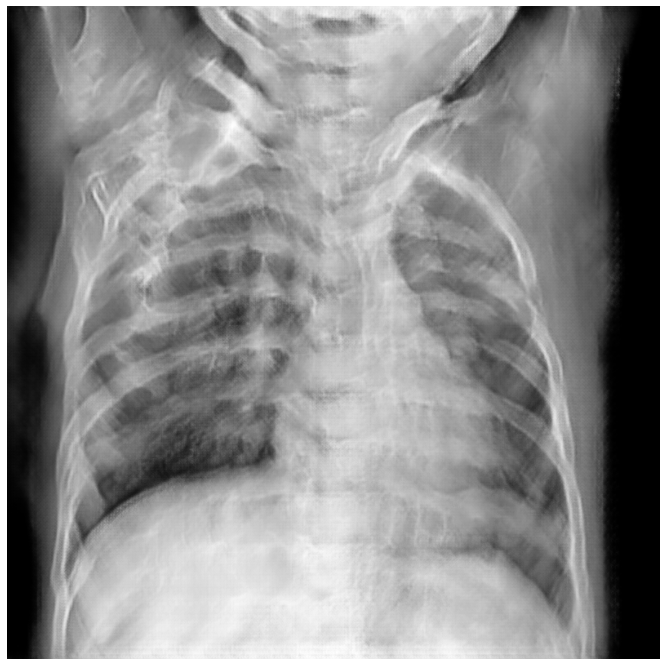

Time for epoch 1501 is 9.97267460823059 sec
Time for epoch 1502 is 9.193710327148438 sec
Time for epoch 1503 is 9.156261205673218 sec
Time for epoch 1504 is 9.258660316467285 sec
Time for epoch 1505 is 9.164894342422485 sec
Time for epoch 1506 is 9.337018251419067 sec
Time for epoch 1507 is 9.226307392120361 sec
Time for epoch 1508 is 9.307449579238892 sec
Time for epoch 1509 is 9.180566310882568 sec
Time for epoch 1510 is 9.171414613723755 sec
Time for epoch 1511 is 9.164867877960205 sec
Time for epoch 1512 is 9.301655769348145 sec
Time for epoch 1513 is 9.181957483291626 sec
Time for epoch 1514 is 9.186437368392944 sec
Time for epoch 1515 is 9.167003870010376 sec
Time for epoch 1516 is 9.255300998687744 sec
Time for epoch 1517 is 9.169865131378174 sec
Time for epoch 1518 is 9.191051483154297 sec
Time for epoch 1519 is 9.17856740951538 sec
Time for epoch 1520 is 9.324487209320068 sec
Time for epoch 1521 is 9.161569595336914 sec
Time for epoch 1522 is 9.16446328163147 sec
Time for epoc

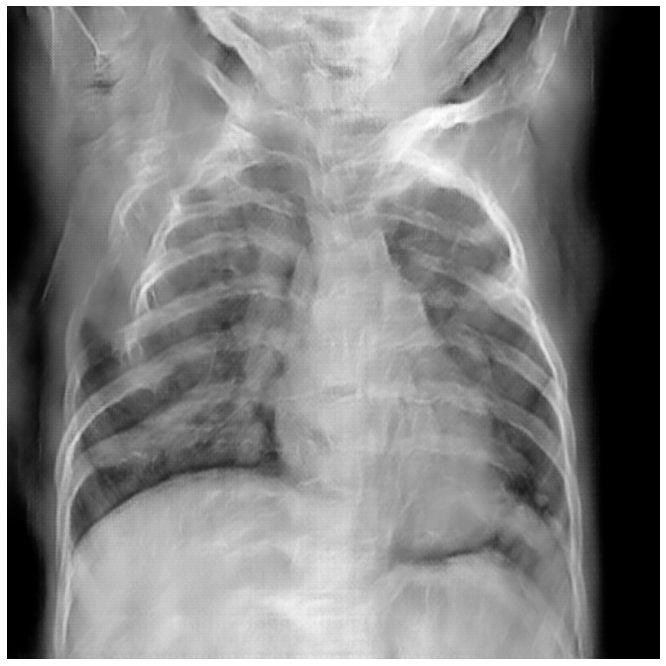

Time for epoch 1601 is 9.868389368057251 sec
Time for epoch 1602 is 9.163768768310547 sec
Time for epoch 1603 is 9.15687608718872 sec
Time for epoch 1604 is 9.425628662109375 sec
Time for epoch 1605 is 9.206762790679932 sec
Time for epoch 1606 is 9.173787117004395 sec
Time for epoch 1607 is 9.173274993896484 sec
Time for epoch 1608 is 9.254863262176514 sec
Time for epoch 1609 is 9.1572847366333 sec
Time for epoch 1610 is 9.201634645462036 sec
Time for epoch 1611 is 9.274990797042847 sec
Time for epoch 1612 is 9.259632110595703 sec
Time for epoch 1613 is 9.161149978637695 sec
Time for epoch 1614 is 9.177529335021973 sec
Time for epoch 1615 is 9.156725645065308 sec
Time for epoch 1616 is 9.434784412384033 sec
Time for epoch 1617 is 9.164237022399902 sec
Time for epoch 1618 is 9.20248556137085 sec
Time for epoch 1619 is 9.163777351379395 sec
Time for epoch 1620 is 9.27813458442688 sec
Time for epoch 1621 is 9.21765947341919 sec
Time for epoch 1622 is 9.33659052848816 sec
Time for epoch 16

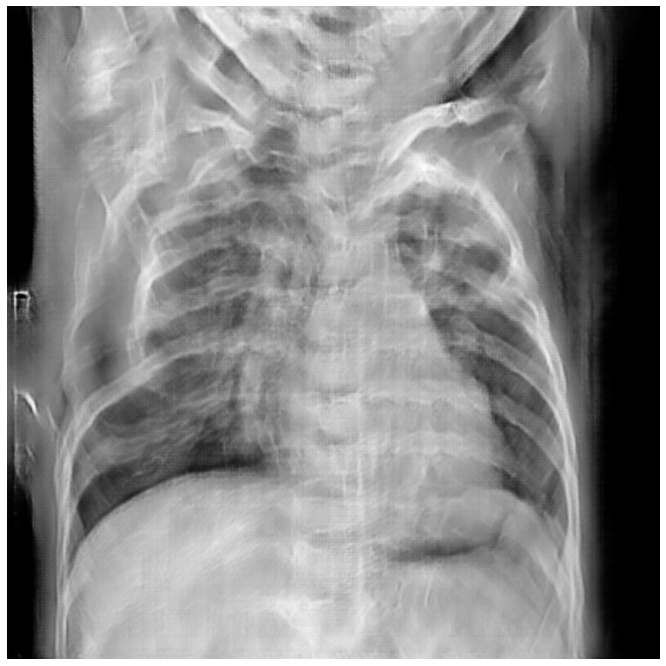

Time for epoch 1701 is 9.861583948135376 sec
Time for epoch 1702 is 9.181419372558594 sec
Time for epoch 1703 is 9.162205696105957 sec
Time for epoch 1704 is 9.389834642410278 sec
Time for epoch 1705 is 9.170054912567139 sec
Time for epoch 1706 is 9.38156509399414 sec
Time for epoch 1707 is 9.165226936340332 sec
Time for epoch 1708 is 9.278390169143677 sec
Time for epoch 1709 is 9.165477752685547 sec
Time for epoch 1710 is 9.211827754974365 sec
Time for epoch 1711 is 9.16530990600586 sec
Time for epoch 1712 is 9.268388748168945 sec
Time for epoch 1713 is 9.162906646728516 sec
Time for epoch 1714 is 9.153795957565308 sec
Time for epoch 1715 is 9.170427799224854 sec
Time for epoch 1716 is 9.480273723602295 sec
Time for epoch 1717 is 9.173078060150146 sec
Time for epoch 1718 is 9.165188312530518 sec
Time for epoch 1719 is 9.181134223937988 sec
Time for epoch 1720 is 9.275442838668823 sec
Time for epoch 1721 is 9.162587881088257 sec
Time for epoch 1722 is 9.325140237808228 sec
Time for epo

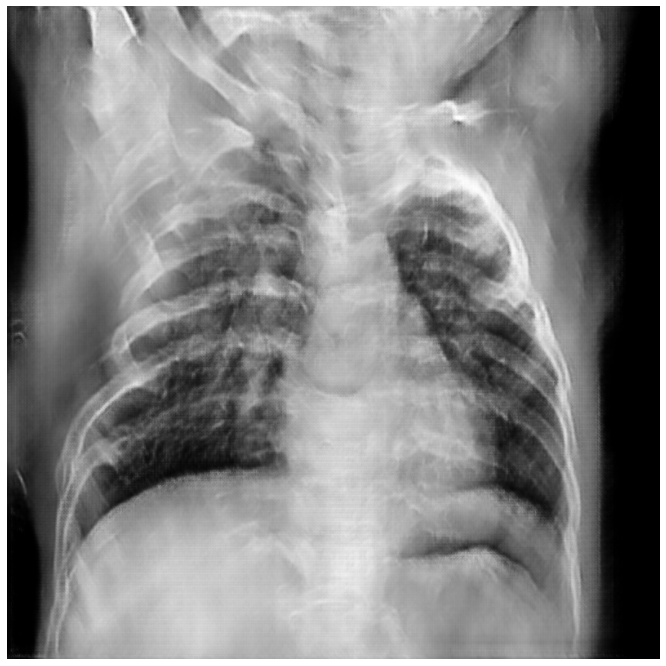

Time for epoch 1801 is 9.856484651565552 sec
Time for epoch 1802 is 9.181097984313965 sec
Time for epoch 1803 is 9.177067995071411 sec
Time for epoch 1804 is 9.337357521057129 sec
Time for epoch 1805 is 9.162431955337524 sec
Time for epoch 1806 is 9.180550336837769 sec
Time for epoch 1807 is 9.17829179763794 sec
Time for epoch 1808 is 9.413463115692139 sec
Time for epoch 1809 is 9.174916505813599 sec
Time for epoch 1810 is 9.178224325180054 sec
Time for epoch 1811 is 9.185035943984985 sec
Time for epoch 1812 is 9.279578924179077 sec
Time for epoch 1813 is 9.180999755859375 sec
Time for epoch 1814 is 9.159666299819946 sec
Time for epoch 1815 is 9.187483787536621 sec
Time for epoch 1816 is 9.390175580978394 sec
Time for epoch 1817 is 9.158901929855347 sec
Time for epoch 1818 is 9.165704727172852 sec
Time for epoch 1819 is 9.172825336456299 sec
Time for epoch 1820 is 9.279207944869995 sec
Time for epoch 1821 is 9.166342735290527 sec
Time for epoch 1822 is 9.353618144989014 sec
Time for ep

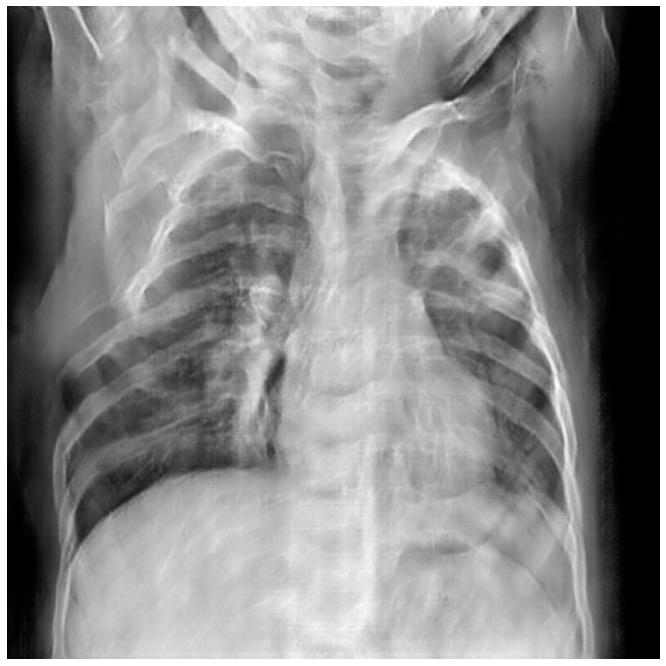

Time for epoch 1901 is 9.840955972671509 sec
Time for epoch 1902 is 9.163352489471436 sec
Time for epoch 1903 is 9.867038488388062 sec
Time for epoch 1904 is 9.323870182037354 sec
Time for epoch 1905 is 9.176429510116577 sec
Time for epoch 1906 is 9.167035341262817 sec
Time for epoch 1907 is 9.164604425430298 sec
Time for epoch 1908 is 9.29418659210205 sec
Time for epoch 1909 is 9.163508176803589 sec
Time for epoch 1910 is 9.28965711593628 sec
Time for epoch 1911 is 9.154011249542236 sec
Time for epoch 1912 is 9.284273862838745 sec
Time for epoch 1913 is 9.179272890090942 sec
Time for epoch 1914 is 9.17958927154541 sec
Time for epoch 1915 is 9.18065357208252 sec
Time for epoch 1916 is 9.466782569885254 sec
Time for epoch 1917 is 9.167533159255981 sec
Time for epoch 1918 is 9.164538145065308 sec
Time for epoch 1919 is 9.178934097290039 sec
Time for epoch 1920 is 9.746993064880371 sec
Time for epoch 1921 is 9.197663068771362 sec
Time for epoch 1922 is 9.243586301803589 sec
Time for epoch

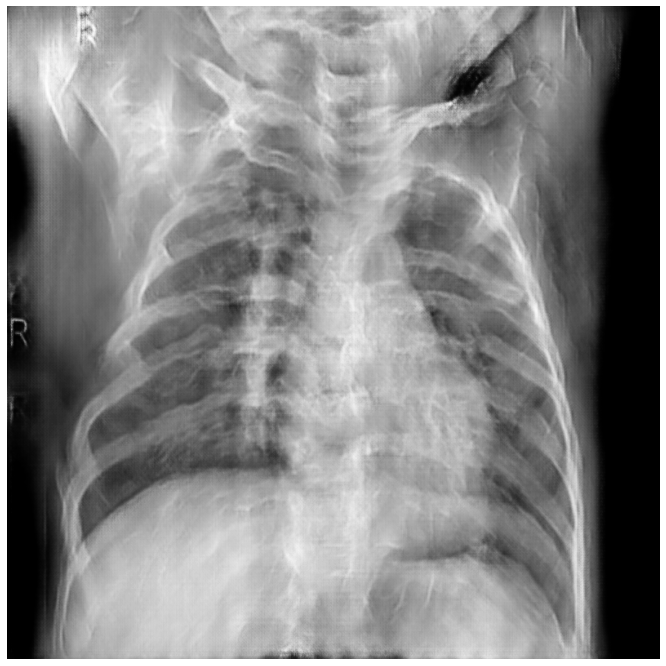

Time for epoch 2001 is 9.958686828613281 sec
Time for epoch 2002 is 9.198251247406006 sec
Time for epoch 2003 is 9.153235673904419 sec
Time for epoch 2004 is 9.271067380905151 sec
Time for epoch 2005 is 9.312809228897095 sec
Time for epoch 2006 is 9.170262098312378 sec
Time for epoch 2007 is 9.160443782806396 sec
Time for epoch 2008 is 9.58315634727478 sec
Time for epoch 2009 is 9.153948307037354 sec
Time for epoch 2010 is 9.15494990348816 sec
Time for epoch 2011 is 9.246734142303467 sec
Time for epoch 2012 is 9.373074769973755 sec
Time for epoch 2013 is 9.156901836395264 sec
Time for epoch 2014 is 9.160828113555908 sec
Time for epoch 2015 is 9.224626064300537 sec
Time for epoch 2016 is 9.2904691696167 sec
Time for epoch 2017 is 9.177820682525635 sec
Time for epoch 2018 is 9.18764352798462 sec
Time for epoch 2019 is 9.183071851730347 sec
Time for epoch 2020 is 9.270234823226929 sec
Time for epoch 2021 is 9.192822933197021 sec
Time for epoch 2022 is 9.201300144195557 sec
Time for epoch 

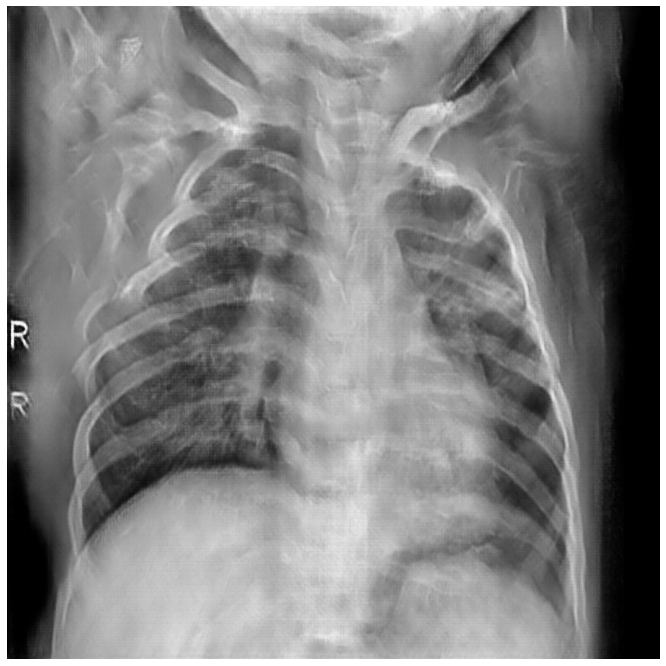

Time for epoch 2101 is 9.864611148834229 sec
Time for epoch 2102 is 9.167487144470215 sec
Time for epoch 2103 is 9.168295860290527 sec
Time for epoch 2104 is 9.293627738952637 sec
Time for epoch 2105 is 9.254113912582397 sec
Time for epoch 2106 is 9.200348138809204 sec
Time for epoch 2107 is 9.169763326644897 sec
Time for epoch 2108 is 9.286226511001587 sec
Time for epoch 2109 is 9.193020582199097 sec
Time for epoch 2110 is 9.638150691986084 sec
Time for epoch 2111 is 9.157445430755615 sec
Time for epoch 2112 is 9.410749673843384 sec
Time for epoch 2113 is 9.1712064743042 sec
Time for epoch 2114 is 9.157901525497437 sec
Time for epoch 2115 is 9.15140700340271 sec
Time for epoch 2116 is 9.287610054016113 sec
Time for epoch 2117 is 9.145497798919678 sec
Time for epoch 2118 is 9.253257036209106 sec
Time for epoch 2119 is 9.180850267410278 sec
Time for epoch 2120 is 9.297683477401733 sec
Time for epoch 2121 is 9.170170545578003 sec
Time for epoch 2122 is 9.187414646148682 sec
Time for epoc

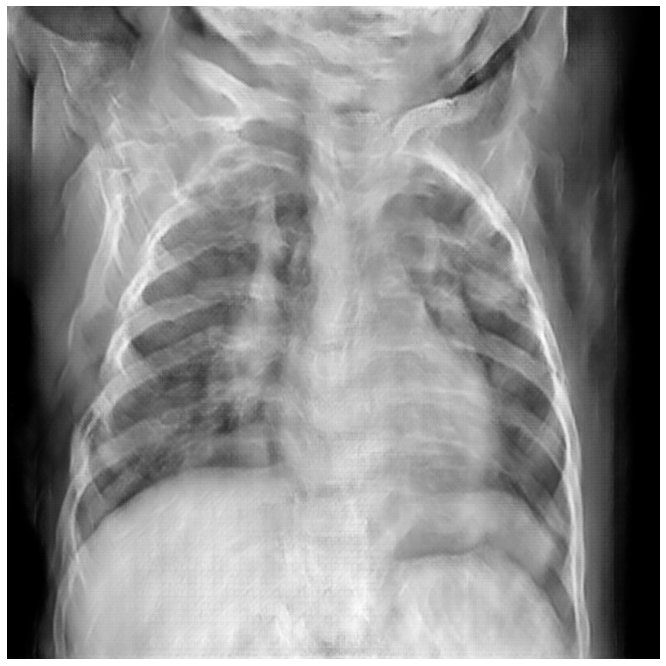

Time for epoch 2201 is 11.677858591079712 sec
Time for epoch 2202 is 9.205507755279541 sec
Time for epoch 2203 is 9.16046929359436 sec
Time for epoch 2204 is 9.29325270652771 sec
Time for epoch 2205 is 9.530651092529297 sec
Time for epoch 2206 is 9.180261611938477 sec
Time for epoch 2207 is 9.208754301071167 sec
Time for epoch 2208 is 9.295545101165771 sec
Time for epoch 2209 is 9.171698570251465 sec
Time for epoch 2210 is 9.153619289398193 sec
Time for epoch 2211 is 9.167292356491089 sec
Time for epoch 2212 is 9.39094352722168 sec
Time for epoch 2213 is 9.189712047576904 sec
Time for epoch 2214 is 9.154341220855713 sec
Time for epoch 2215 is 9.169926404953003 sec
Time for epoch 2216 is 9.303589820861816 sec
Time for epoch 2217 is 9.174588441848755 sec
Time for epoch 2218 is 9.16496753692627 sec
Time for epoch 2219 is 9.200962781906128 sec
Time for epoch 2220 is 9.29476022720337 sec
Time for epoch 2221 is 9.167190551757812 sec
Time for epoch 2222 is 9.161665916442871 sec
Time for epoch

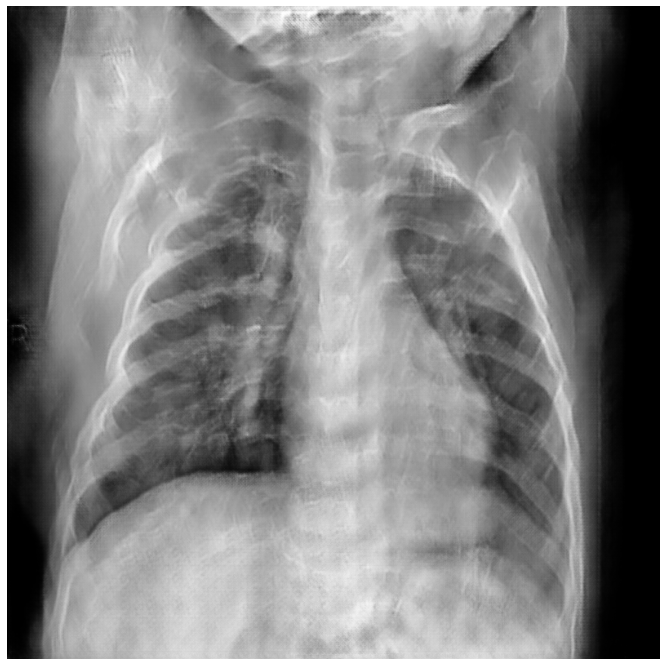

Time for epoch 2301 is 9.891024589538574 sec
Time for epoch 2302 is 9.280241966247559 sec
Time for epoch 2303 is 9.19249701499939 sec
Time for epoch 2304 is 9.295958042144775 sec
Time for epoch 2305 is 9.188777208328247 sec
Time for epoch 2306 is 9.182433605194092 sec
Time for epoch 2307 is 9.160297632217407 sec
Time for epoch 2308 is 9.374344110488892 sec
Time for epoch 2309 is 9.205941915512085 sec
Time for epoch 2310 is 9.180485725402832 sec
Time for epoch 2311 is 9.177578687667847 sec
Time for epoch 2312 is 9.306954622268677 sec
Time for epoch 2313 is 9.179502725601196 sec
Time for epoch 2314 is 9.180559158325195 sec
Time for epoch 2315 is 9.209537267684937 sec
Time for epoch 2316 is 9.317636013031006 sec
Time for epoch 2317 is 9.412373781204224 sec
Time for epoch 2318 is 9.171014070510864 sec
Time for epoch 2319 is 9.164660453796387 sec
Time for epoch 2320 is 9.302305221557617 sec
Time for epoch 2321 is 9.373283863067627 sec
Time for epoch 2322 is 9.166571378707886 sec
Time for ep

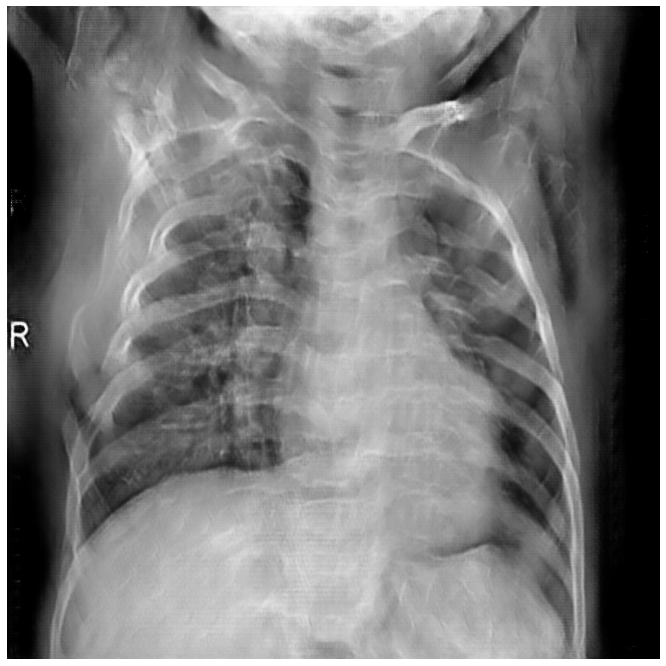

Time for epoch 2401 is 10.032790422439575 sec
Time for epoch 2402 is 9.379984140396118 sec
Time for epoch 2403 is 9.159992694854736 sec
Time for epoch 2404 is 9.505461931228638 sec
Time for epoch 2405 is 9.209521055221558 sec
Time for epoch 2406 is 9.167430877685547 sec
Time for epoch 2407 is 9.177847623825073 sec
Time for epoch 2408 is 9.329392671585083 sec
Time for epoch 2409 is 9.16572904586792 sec
Time for epoch 2410 is 9.17527723312378 sec
Time for epoch 2411 is 9.2232186794281 sec
Time for epoch 2412 is 9.308180809020996 sec
Time for epoch 2413 is 9.152456045150757 sec
Time for epoch 2414 is 9.159084558486938 sec
Time for epoch 2415 is 9.170342683792114 sec
Time for epoch 2416 is 9.374549388885498 sec
Time for epoch 2417 is 9.21337366104126 sec
Time for epoch 2418 is 9.190922498703003 sec
Time for epoch 2419 is 9.443631649017334 sec
Time for epoch 2420 is 9.315639972686768 sec
Time for epoch 2421 is 9.174180030822754 sec
Time for epoch 2422 is 9.169533967971802 sec
Time for epoch

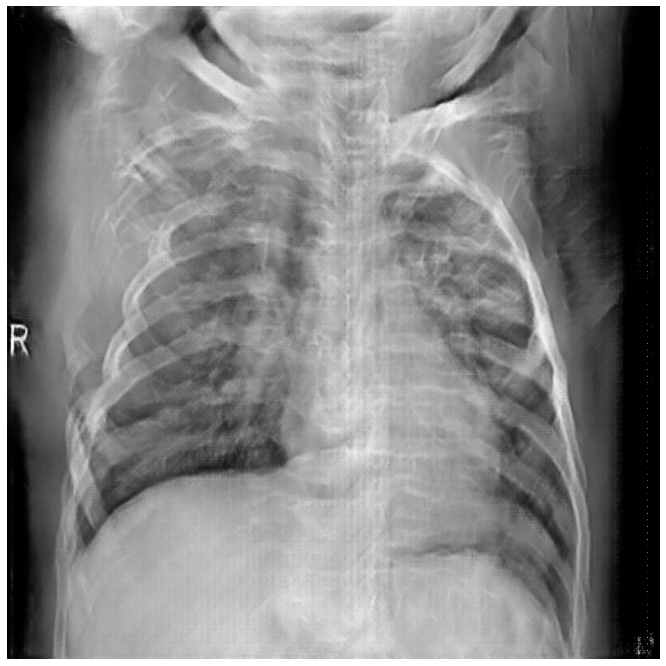

Time for epoch 2501 is 9.868002653121948 sec
Time for epoch 2502 is 9.176172256469727 sec
Time for epoch 2503 is 9.174882173538208 sec
Time for epoch 2504 is 9.735120296478271 sec
Time for epoch 2505 is 9.307083129882812 sec
Time for epoch 2506 is 9.19551420211792 sec
Time for epoch 2507 is 9.184072017669678 sec
Time for epoch 2508 is 9.309939622879028 sec
Time for epoch 2509 is 9.152482509613037 sec
Time for epoch 2510 is 9.152862071990967 sec
Time for epoch 2511 is 9.224583148956299 sec
Time for epoch 2512 is 9.332613229751587 sec
Time for epoch 2513 is 9.153812646865845 sec
Time for epoch 2514 is 9.15887975692749 sec
Time for epoch 2515 is 9.162716150283813 sec
Time for epoch 2516 is 9.327008724212646 sec
Time for epoch 2517 is 9.155202865600586 sec
Time for epoch 2518 is 9.17896056175232 sec
Time for epoch 2519 is 9.168593406677246 sec
Time for epoch 2520 is 9.296293020248413 sec
Time for epoch 2521 is 9.593844890594482 sec
Time for epoch 2522 is 9.156130313873291 sec
Time for epoc

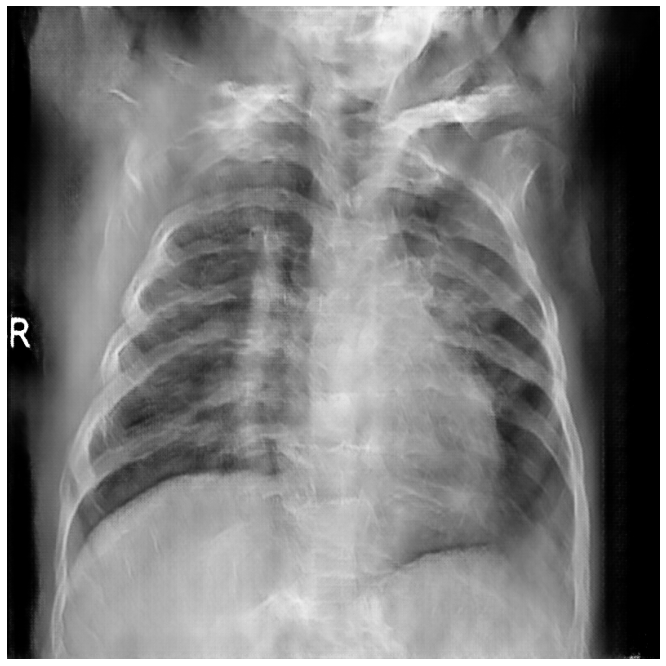

Time for epoch 2601 is 9.849131345748901 sec
Time for epoch 2602 is 9.180491209030151 sec
Time for epoch 2603 is 9.190945386886597 sec
Time for epoch 2604 is 9.30952525138855 sec
Time for epoch 2605 is 9.157280206680298 sec
Time for epoch 2606 is 9.196532249450684 sec
Time for epoch 2607 is 9.17413592338562 sec
Time for epoch 2608 is 9.343200445175171 sec
Time for epoch 2609 is 9.173262357711792 sec
Time for epoch 2610 is 9.155397176742554 sec
Time for epoch 2611 is 9.17829704284668 sec
Time for epoch 2612 is 9.508213758468628 sec
Time for epoch 2613 is 9.18215823173523 sec
Time for epoch 2614 is 9.154858827590942 sec
Time for epoch 2615 is 9.162287473678589 sec
Time for epoch 2616 is 9.314758539199829 sec
Time for epoch 2617 is 9.161092042922974 sec
Time for epoch 2618 is 9.26511287689209 sec
Time for epoch 2619 is 9.205801248550415 sec
Time for epoch 2620 is 9.315158128738403 sec
Time for epoch 2621 is 9.154289484024048 sec
Time for epoch 2622 is 9.169522523880005 sec
Time for epoch 

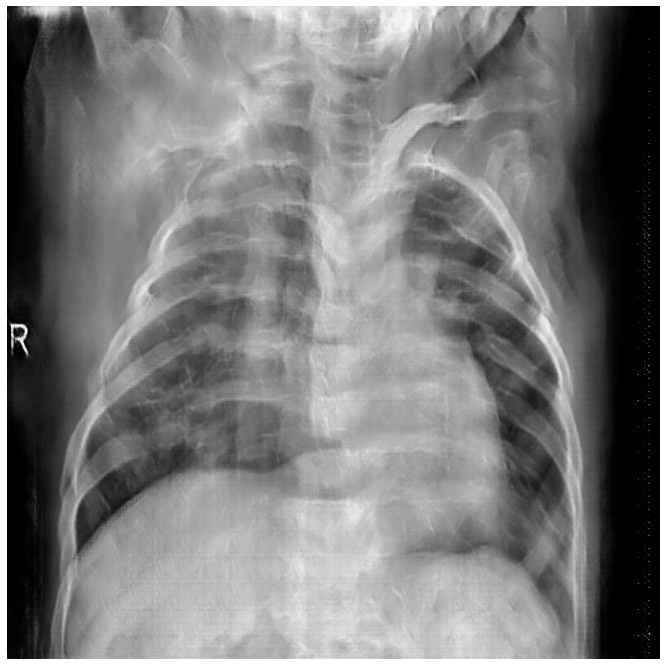

Time for epoch 2701 is 9.832923650741577 sec
Time for epoch 2702 is 9.162733316421509 sec
Time for epoch 2703 is 9.152794361114502 sec
Time for epoch 2704 is 9.340774059295654 sec
Time for epoch 2705 is 9.174622297286987 sec
Time for epoch 2706 is 9.33630919456482 sec
Time for epoch 2707 is 9.155472040176392 sec
Time for epoch 2708 is 9.449472188949585 sec
Time for epoch 2709 is 9.165563106536865 sec
Time for epoch 2710 is 9.152613878250122 sec
Time for epoch 2711 is 9.150883674621582 sec
Time for epoch 2712 is 9.511438131332397 sec
Time for epoch 2713 is 9.194910526275635 sec
Time for epoch 2714 is 9.152783155441284 sec
Time for epoch 2715 is 9.165041208267212 sec
Time for epoch 2716 is 9.329607963562012 sec
Time for epoch 2717 is 9.159609079360962 sec
Time for epoch 2718 is 9.182798147201538 sec
Time for epoch 2719 is 9.201233863830566 sec
Time for epoch 2720 is 9.317954778671265 sec
Time for epoch 2721 is 9.18099594116211 sec
Time for epoch 2722 is 9.181138753890991 sec
Time for epo

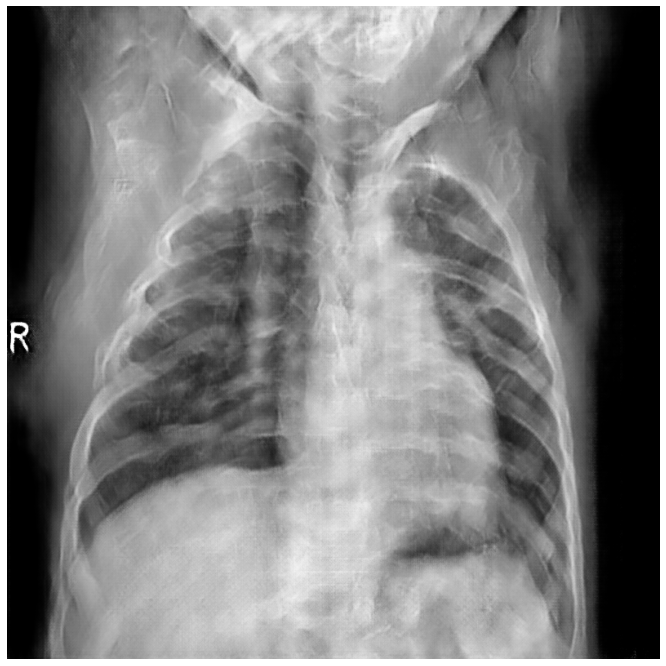

Time for epoch 2801 is 9.869294881820679 sec
Time for epoch 2802 is 9.170392274856567 sec
Time for epoch 2803 is 9.502249240875244 sec
Time for epoch 2804 is 9.348990201950073 sec
Time for epoch 2805 is 9.157081365585327 sec
Time for epoch 2806 is 9.166604280471802 sec
Time for epoch 2807 is 9.192612409591675 sec
Time for epoch 2808 is 9.336609601974487 sec
Time for epoch 2809 is 9.167906045913696 sec
Time for epoch 2810 is 9.440535306930542 sec
Time for epoch 2811 is 9.20273208618164 sec
Time for epoch 2812 is 9.300129175186157 sec
Time for epoch 2813 is 9.22870922088623 sec
Time for epoch 2814 is 9.201640844345093 sec
Time for epoch 2815 is 9.181786298751831 sec
Time for epoch 2816 is 11.180411338806152 sec
Time for epoch 2817 is 9.166843891143799 sec
Time for epoch 2818 is 9.155605792999268 sec
Time for epoch 2819 is 9.17307996749878 sec
Time for epoch 2820 is 9.876676797866821 sec
Time for epoch 2821 is 9.204480409622192 sec
Time for epoch 2822 is 9.165122747421265 sec
Time for epo

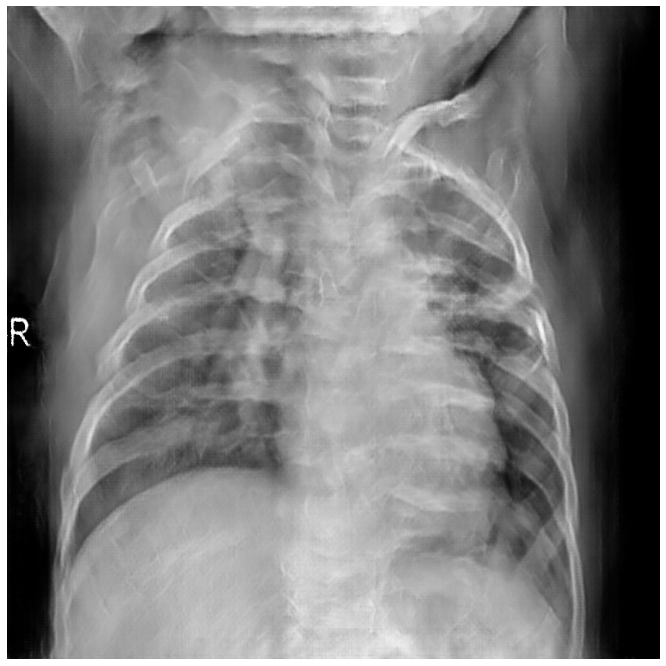

Time for epoch 2901 is 9.932081460952759 sec
Time for epoch 2902 is 9.1591956615448 sec
Time for epoch 2903 is 9.197980165481567 sec
Time for epoch 2904 is 9.329655885696411 sec
Time for epoch 2905 is 9.541032552719116 sec
Time for epoch 2906 is 9.160914182662964 sec
Time for epoch 2907 is 9.164595365524292 sec
Time for epoch 2908 is 9.36733078956604 sec
Time for epoch 2909 is 9.242419958114624 sec
Time for epoch 2910 is 9.202491283416748 sec
Time for epoch 2911 is 9.165048122406006 sec
Time for epoch 2912 is 9.5979745388031 sec
Time for epoch 2913 is 9.16075086593628 sec
Time for epoch 2914 is 9.167458534240723 sec
Time for epoch 2915 is 9.200913667678833 sec
Time for epoch 2916 is 9.37505578994751 sec
Time for epoch 2917 is 9.188671588897705 sec
Time for epoch 2918 is 9.184250831604004 sec
Time for epoch 2919 is 9.181573867797852 sec
Time for epoch 2920 is 9.348718881607056 sec
Time for epoch 2921 is 9.158294677734375 sec
Time for epoch 2922 is 9.25652527809143 sec
Time for epoch 292

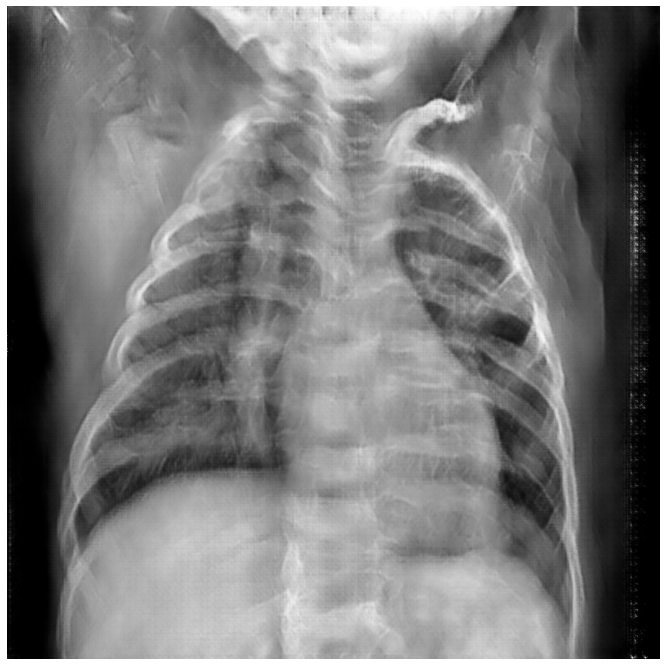

Time for epoch 3001 is 9.879616260528564 sec
Time for epoch 3002 is 9.168730020523071 sec
Time for epoch 3003 is 9.16472053527832 sec
Time for epoch 3004 is 9.391084671020508 sec
Time for epoch 3005 is 9.191259622573853 sec
Time for epoch 3006 is 9.169628620147705 sec
Time for epoch 3007 is 9.18325161933899 sec
Time for epoch 3008 is 9.324541568756104 sec
Time for epoch 3009 is 9.161037921905518 sec
Time for epoch 3010 is 9.167333841323853 sec
Time for epoch 3011 is 9.184394598007202 sec
Time for epoch 3012 is 9.355836153030396 sec
Time for epoch 3013 is 9.168415307998657 sec
Time for epoch 3014 is 9.189599514007568 sec
Time for epoch 3015 is 9.161816596984863 sec
Time for epoch 3016 is 9.332639455795288 sec
Time for epoch 3017 is 9.312910318374634 sec
Time for epoch 3018 is 9.179267406463623 sec
Time for epoch 3019 is 9.168138265609741 sec
Time for epoch 3020 is 9.349207639694214 sec
Time for epoch 3021 is 9.230133056640625 sec
Time for epoch 3022 is 9.15823245048523 sec
Time for epoc

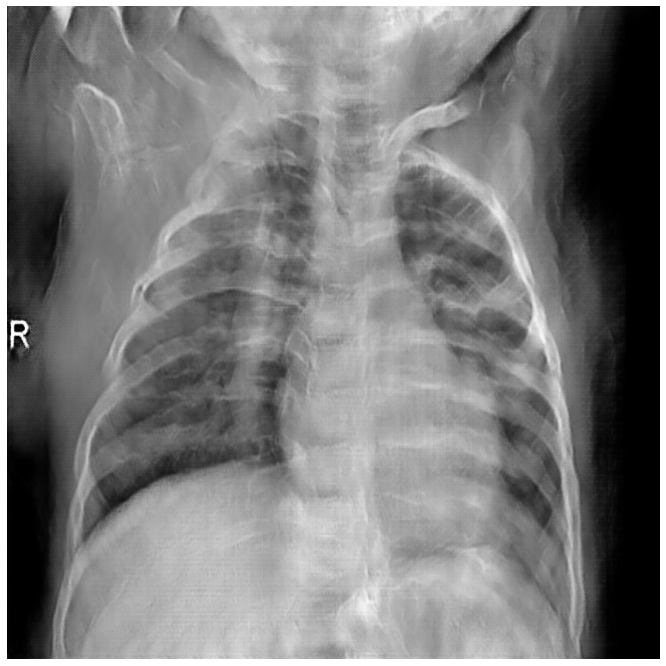

Time for epoch 3101 is 9.849630117416382 sec
Time for epoch 3102 is 9.182350158691406 sec
Time for epoch 3103 is 9.159954309463501 sec
Time for epoch 3104 is 9.33630919456482 sec
Time for epoch 3105 is 9.323938131332397 sec
Time for epoch 3106 is 9.208343029022217 sec
Time for epoch 3107 is 9.154849767684937 sec
Time for epoch 3108 is 9.334681034088135 sec
Time for epoch 3109 is 9.170929908752441 sec
Time for epoch 3110 is 9.173402547836304 sec
Time for epoch 3111 is 9.192223310470581 sec
Time for epoch 3112 is 9.39460563659668 sec
Time for epoch 3113 is 9.361664056777954 sec
Time for epoch 3114 is 9.170156717300415 sec
Time for epoch 3115 is 9.160994052886963 sec
Time for epoch 3116 is 9.342449426651001 sec
Time for epoch 3117 is 9.165766477584839 sec
Time for epoch 3118 is 9.183029413223267 sec
Time for epoch 3119 is 9.17815899848938 sec
Time for epoch 3120 is 9.342366933822632 sec
Time for epoch 3121 is 9.152570486068726 sec
Time for epoch 3122 is 9.164241552352905 sec
Time for epoc

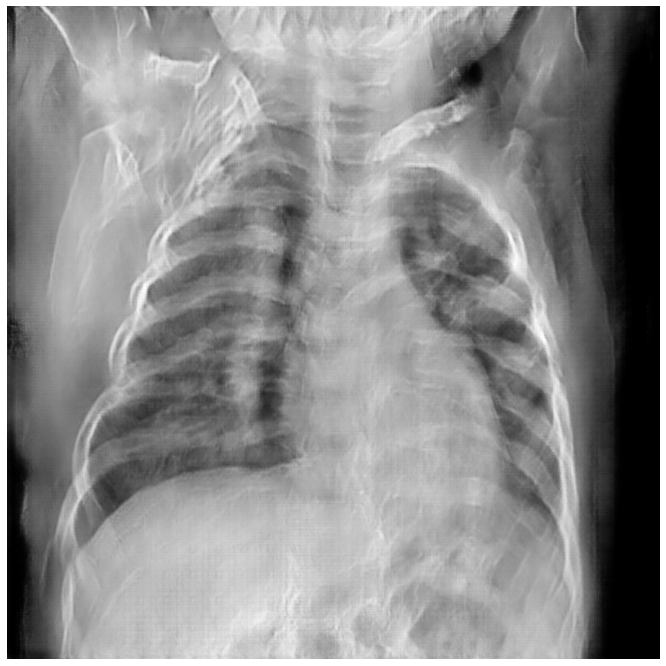

Time for epoch 3201 is 9.943618059158325 sec
Time for epoch 3202 is 9.326918363571167 sec
Time for epoch 3203 is 9.189868688583374 sec
Time for epoch 3204 is 9.354218482971191 sec
Time for epoch 3205 is 9.166137218475342 sec
Time for epoch 3206 is 9.174794912338257 sec
Time for epoch 3207 is 9.159592151641846 sec
Time for epoch 3208 is 9.57245945930481 sec
Time for epoch 3209 is 9.185776948928833 sec
Time for epoch 3210 is 9.166228532791138 sec
Time for epoch 3211 is 9.201843738555908 sec
Time for epoch 3212 is 9.349023818969727 sec
Time for epoch 3213 is 9.15999174118042 sec
Time for epoch 3214 is 9.173412322998047 sec
Time for epoch 3215 is 9.491617918014526 sec
Time for epoch 3216 is 9.347330570220947 sec
Time for epoch 3217 is 9.159915685653687 sec
Time for epoch 3218 is 9.164794921875 sec
Time for epoch 3219 is 9.151419401168823 sec
Time for epoch 3220 is 9.385228633880615 sec
Time for epoch 3221 is 9.190194606781006 sec
Time for epoch 3222 is 9.16141963005066 sec
Time for epoch 3

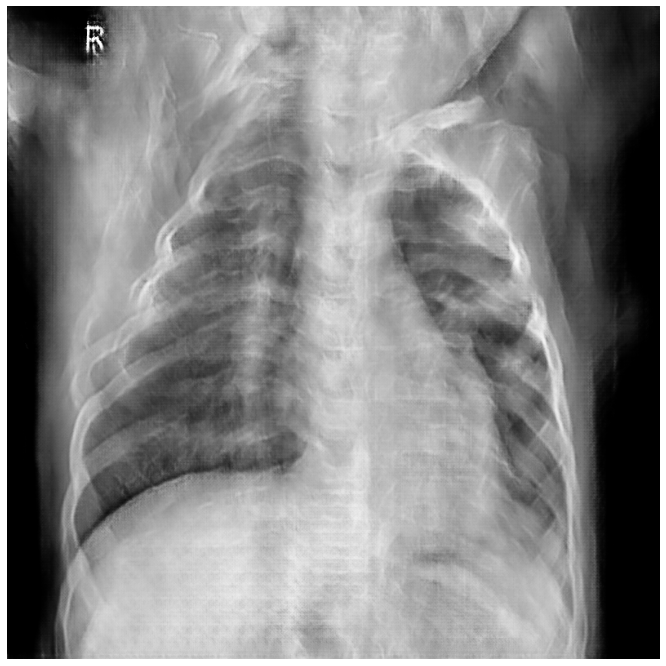

Time for epoch 3301 is 9.856224775314331 sec
Time for epoch 3302 is 9.179457902908325 sec
Time for epoch 3303 is 9.16951036453247 sec
Time for epoch 3304 is 9.535796642303467 sec
Time for epoch 3305 is 9.192251682281494 sec
Time for epoch 3306 is 9.174415111541748 sec
Time for epoch 3307 is 9.165080308914185 sec
Time for epoch 3308 is 9.356894969940186 sec
Time for epoch 3309 is 9.173542499542236 sec
Time for epoch 3310 is 9.614100694656372 sec
Time for epoch 3311 is 9.206036567687988 sec
Time for epoch 3312 is 9.379481554031372 sec
Time for epoch 3313 is 9.163636445999146 sec
Time for epoch 3314 is 9.16042971611023 sec
Time for epoch 3315 is 9.160420894622803 sec
Time for epoch 3316 is 9.358802318572998 sec
Time for epoch 3317 is 9.212774515151978 sec
Time for epoch 3318 is 9.164308786392212 sec
Time for epoch 3319 is 9.178943634033203 sec
Time for epoch 3320 is 9.353554964065552 sec
Time for epoch 3321 is 9.161673069000244 sec
Time for epoch 3322 is 9.170969724655151 sec
Time for epo

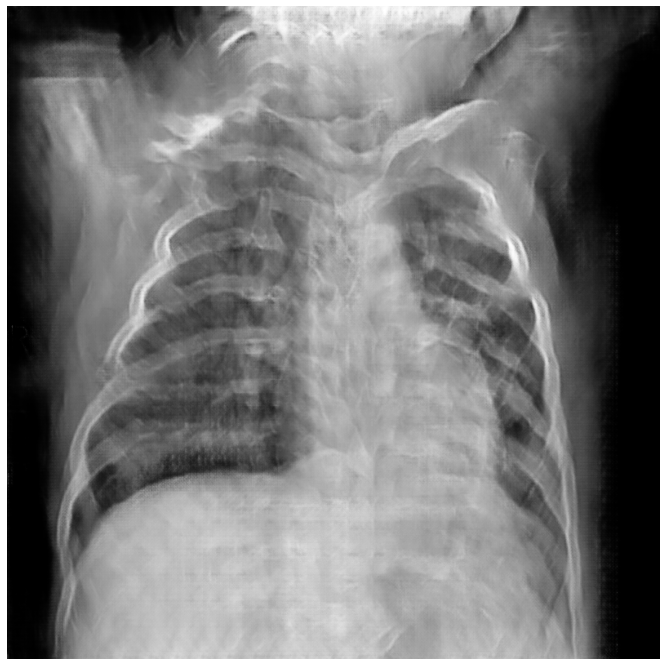

Time for epoch 3401 is 10.006020545959473 sec
Time for epoch 3402 is 9.1982581615448 sec
Time for epoch 3403 is 9.16371488571167 sec
Time for epoch 3404 is 9.369033098220825 sec
Time for epoch 3405 is 9.161643981933594 sec
Time for epoch 3406 is 9.16927695274353 sec
Time for epoch 3407 is 9.165601015090942 sec
Time for epoch 3408 is 10.021583080291748 sec
Time for epoch 3409 is 9.21990418434143 sec
Time for epoch 3410 is 9.160530090332031 sec
Time for epoch 3411 is 9.182721853256226 sec
Time for epoch 3412 is 9.35478138923645 sec
Time for epoch 3413 is 9.154651880264282 sec
Time for epoch 3414 is 9.33356499671936 sec
Time for epoch 3415 is 9.199933290481567 sec
Time for epoch 3416 is 9.438413858413696 sec
Time for epoch 3417 is 9.162394762039185 sec
Time for epoch 3418 is 9.16877293586731 sec
Time for epoch 3419 is 9.172448873519897 sec
Time for epoch 3420 is 9.42878270149231 sec
Time for epoch 3421 is 9.208158016204834 sec
Time for epoch 3422 is 9.228064060211182 sec
Time for epoch 34

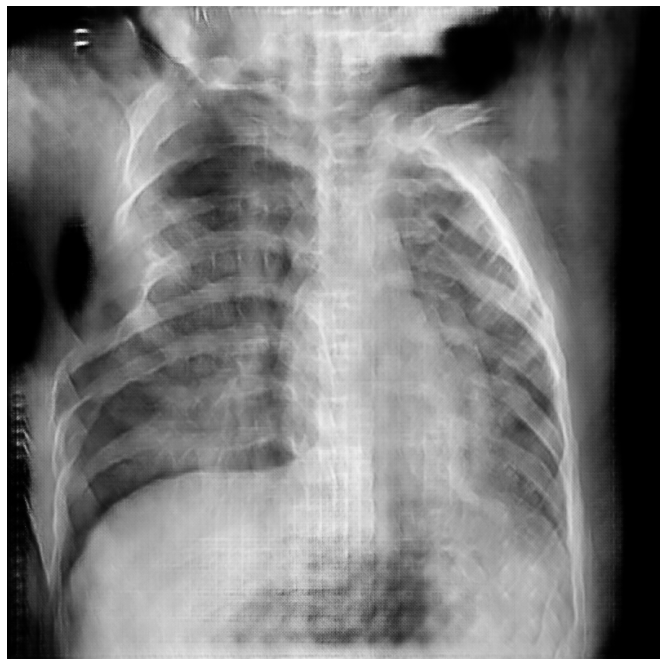

Time for epoch 3501 is 9.873273849487305 sec
Time for epoch 3502 is 9.188323020935059 sec
Time for epoch 3503 is 9.169172525405884 sec
Time for epoch 3504 is 9.363567590713501 sec
Time for epoch 3505 is 9.342982530593872 sec
Time for epoch 3506 is 9.171094417572021 sec
Time for epoch 3507 is 9.16293978691101 sec
Time for epoch 3508 is 9.410994529724121 sec
Time for epoch 3509 is 9.17333197593689 sec
Time for epoch 3510 is 9.168339252471924 sec
Time for epoch 3511 is 9.315865755081177 sec
Time for epoch 3512 is 9.443199634552002 sec
Time for epoch 3513 is 9.158218622207642 sec
Time for epoch 3514 is 9.155175685882568 sec
Time for epoch 3515 is 9.15720796585083 sec
Time for epoch 3516 is 9.777271509170532 sec
Time for epoch 3517 is 9.195690155029297 sec
Time for epoch 3518 is 9.256152391433716 sec
Time for epoch 3519 is 9.165347576141357 sec
Time for epoch 3520 is 9.373148441314697 sec
Time for epoch 3521 is 9.167593240737915 sec
Time for epoch 3522 is 9.171568393707275 sec
Time for epoc

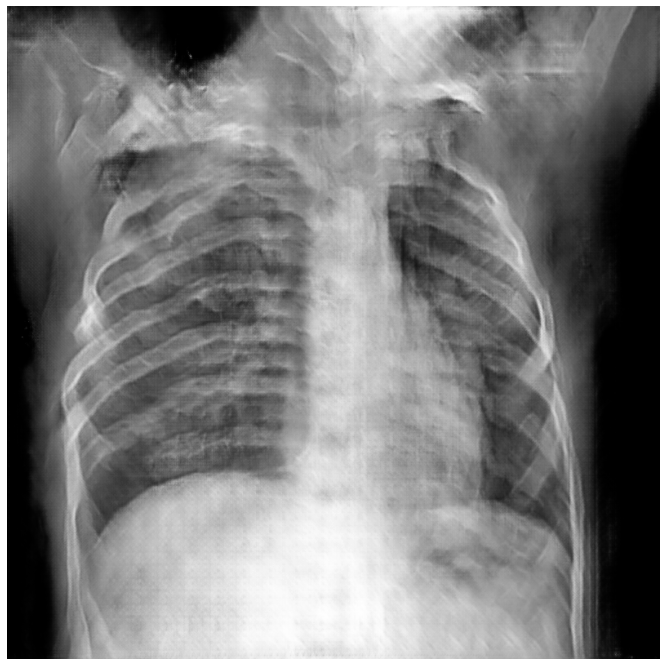

Time for epoch 3601 is 9.862550735473633 sec
Time for epoch 3602 is 9.172639846801758 sec
Time for epoch 3603 is 9.159051895141602 sec
Time for epoch 3604 is 9.457916736602783 sec
Time for epoch 3605 is 9.160019636154175 sec
Time for epoch 3606 is 9.164793729782104 sec
Time for epoch 3607 is 9.331844568252563 sec
Time for epoch 3608 is 9.423930406570435 sec
Time for epoch 3609 is 9.173293590545654 sec
Time for epoch 3610 is 9.178718566894531 sec
Time for epoch 3611 is 9.17837643623352 sec
Time for epoch 3612 is 9.361353158950806 sec
Time for epoch 3613 is 9.152870893478394 sec
Time for epoch 3614 is 9.5428946018219 sec
Time for epoch 3615 is 9.223094701766968 sec
Time for epoch 3616 is 9.393846273422241 sec
Time for epoch 3617 is 9.156656980514526 sec
Time for epoch 3618 is 9.158924102783203 sec
Time for epoch 3619 is 9.169745922088623 sec
Time for epoch 3620 is 9.581665277481079 sec
Time for epoch 3621 is 9.161725759506226 sec
Time for epoch 3622 is 9.15409255027771 sec
Time for epoch

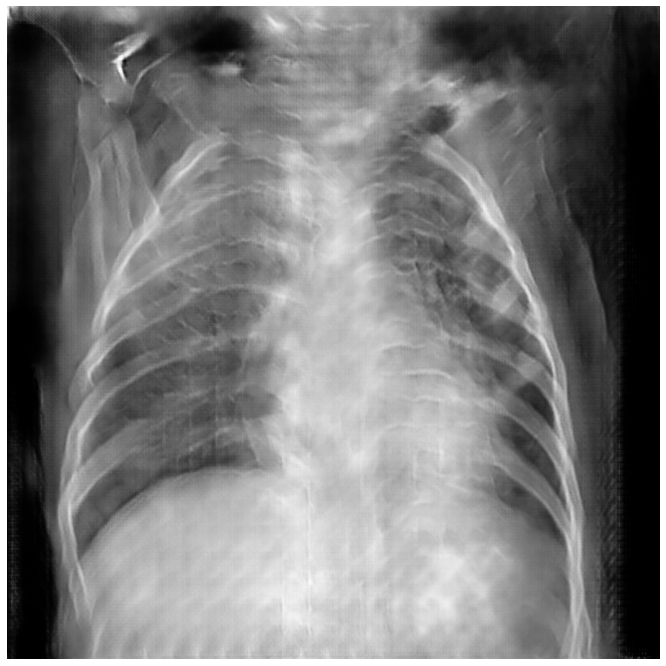

Time for epoch 3701 is 9.83970308303833 sec
Time for epoch 3702 is 9.170692920684814 sec
Time for epoch 3703 is 9.17426323890686 sec
Time for epoch 3704 is 9.57568073272705 sec
Time for epoch 3705 is 9.21239423751831 sec
Time for epoch 3706 is 9.180530548095703 sec
Time for epoch 3707 is 9.160017251968384 sec
Time for epoch 3708 is 9.380899667739868 sec
Time for epoch 3709 is 9.156676292419434 sec
Time for epoch 3710 is 9.156779050827026 sec
Time for epoch 3711 is 9.215688705444336 sec
Time for epoch 3712 is 9.670824527740479 sec
Time for epoch 3713 is 9.200656414031982 sec
Time for epoch 3714 is 9.163740158081055 sec
Time for epoch 3715 is 9.16188383102417 sec
Time for epoch 3716 is 9.372798442840576 sec
Time for epoch 3717 is 9.317820072174072 sec
Time for epoch 3718 is 9.160842418670654 sec
Time for epoch 3719 is 9.175353288650513 sec
Time for epoch 3720 is 9.383871793746948 sec
Time for epoch 3721 is 9.169808149337769 sec
Time for epoch 3722 is 9.179572343826294 sec
Time for epoch 

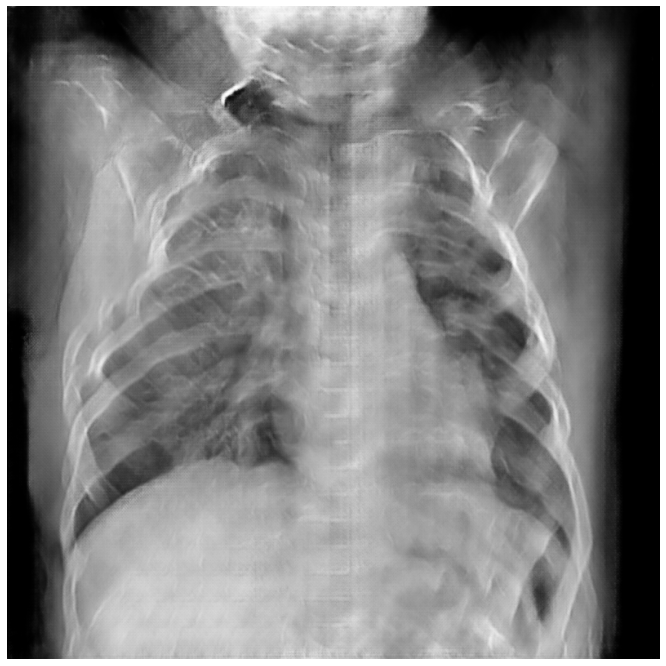

Time for epoch 3801 is 9.844883441925049 sec
Time for epoch 3802 is 9.164822816848755 sec
Time for epoch 3803 is 9.165353059768677 sec
Time for epoch 3804 is 9.375022411346436 sec
Time for epoch 3805 is 9.154972314834595 sec
Time for epoch 3806 is 9.181017398834229 sec
Time for epoch 3807 is 9.16865062713623 sec
Time for epoch 3808 is 9.382289171218872 sec
Time for epoch 3809 is 9.15334939956665 sec
Time for epoch 3810 is 9.165998935699463 sec
Time for epoch 3811 is 9.15603518486023 sec
Time for epoch 3812 is 9.493202924728394 sec
Time for epoch 3813 is 9.160133838653564 sec
Time for epoch 3814 is 9.168447494506836 sec
Time for epoch 3815 is 9.15570878982544 sec
Time for epoch 3816 is 9.394515991210938 sec
Time for epoch 3817 is 9.48596978187561 sec
Time for epoch 3818 is 9.314665079116821 sec
Time for epoch 3819 is 9.180874586105347 sec
Time for epoch 3820 is 9.397106170654297 sec
Time for epoch 3821 is 9.161417961120605 sec
Time for epoch 3822 is 9.159346580505371 sec
Time for epoch 

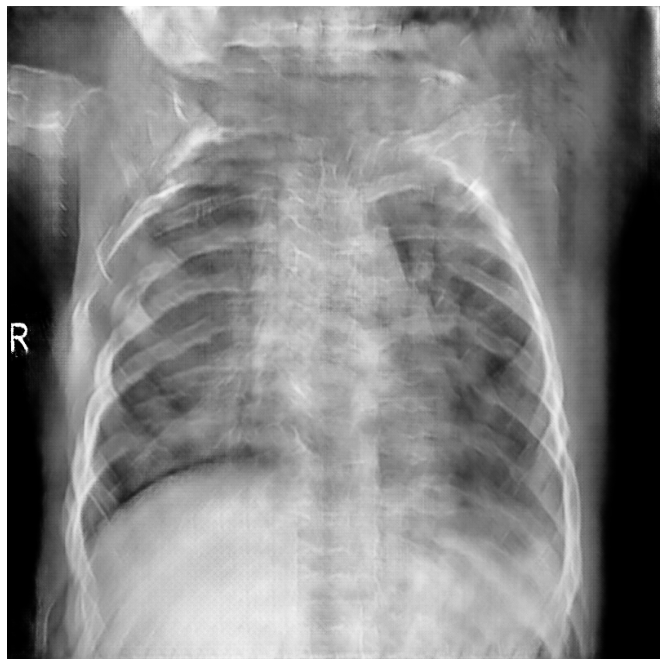

Time for epoch 3901 is 9.8673677444458 sec
Time for epoch 3902 is 9.310464859008789 sec
Time for epoch 3903 is 9.167786598205566 sec
Time for epoch 3904 is 9.430023908615112 sec
Time for epoch 3905 is 9.17557430267334 sec
Time for epoch 3906 is 9.171711444854736 sec
Time for epoch 3907 is 9.18520450592041 sec
Time for epoch 3908 is 9.610147953033447 sec
Time for epoch 3909 is 9.195982217788696 sec
Time for epoch 3910 is 9.186537742614746 sec
Time for epoch 3911 is 9.173548936843872 sec
Time for epoch 3912 is 9.425734281539917 sec
Time for epoch 3913 is 9.168036222457886 sec
Time for epoch 3914 is 11.020812749862671 sec
Time for epoch 3915 is 9.180366277694702 sec
Time for epoch 3916 is 9.45710015296936 sec
Time for epoch 3917 is 9.176504135131836 sec
Time for epoch 3918 is 9.178931713104248 sec
Time for epoch 3919 is 9.186100006103516 sec
Time for epoch 3920 is 9.400254726409912 sec
Time for epoch 3921 is 9.183786869049072 sec
Time for epoch 3922 is 9.332500696182251 sec
Time for epoch

2023-01-08 19:24:39.427314: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


In [15]:
train(train_dataset, EPOCHS)

generator.save('/kaggle/working/generator')
discriminator.save('/kaggle/working/discriminator')